In [1]:
import pandas as pd
import numpy as np
import yfinance as yf
from datetime import datetime
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from keras.models import Model
from keras.layers import Input, LSTM, Dense, Reshape, Dropout, GRU, Conv2D, Conv1D, TimeDistributed
from tensorflow.keras.layers import BatchNormalization
from tqdm import tqdm
from tensorflow.keras.layers import Input, Dense, Concatenate, Reshape, LSTM, MultiHeadAttention
from tensorflow.keras.layers import Input, Dense, Concatenate, Reshape, LSTM, MultiHeadAttention, Attention, AdditiveAttention
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback


2023-12-11 21:52:35.647351: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-11 21:52:35.647442: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-11 21:52:35.647480: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-11 21:52:35.656530: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
import os
import tensorflow as tf

os.environ["CUDA_VISIBLE_DEVICES"] = "7"  # Replace "0" with the index of the desired GPU

# Check if GPU is available
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only use the specified GPU
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

    # Check GPU information
    physical_devices = tf.config.experimental.list_physical_devices('GPU')
    print(f"Using GPU: {tf.test.gpu_device_name()}")

Using GPU: /device:GPU:0


2023-12-11 21:52:54.113995: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1886] Created device /device:GPU:0 with 610 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:e1:00.0, compute capability: 8.6


In [3]:
scaler = MinMaxScaler()


def dataset_gen(data_full_df):
    
    columns_to_normalize = ['Open','High', 'Low', 'Close', 'Volume']
    data_full_df[columns_to_normalize] = scaler.fit_transform(data_full_df[columns_to_normalize])
    data_full_df = data_full_df.drop(columns=['Adj Close'], axis=1)
    print(data_full_df.head(5))
    data_full_np = data_full_df.values
    
    x_train = []
    y_train = []
    x_test = []
    y_test = []

    last_index = 0
    for i in tqdm(range(0, data_full_np.shape[0] - 300)):
        x_train.append(data_full_np[i:i + 200])
        y_train.append(data_full_np[i + 200:i + 220])
        last_index= i
    x_train = np.array(x_train)
    y_train = np.array(y_train)
    
    x_test.append( data_full_np[last_index+10: last_index+210])
    y_test.append(data_full_np[last_index+210: last_index+230])
    x_test.append(data_full_np[last_index+40: last_index+240])
    y_test.append(data_full_np[last_index+240: last_index+260])
    x_test.append(data_full_np[last_index+60: last_index+260])
    y_test.append(data_full_np[last_index+260: last_index+280])
    
    x_test = np.array(x_test)
    y_test = np.array(y_test)
    
    print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)
    return x_train, y_train, x_test, y_test

In [4]:
AMZN_df = pd.read_csv('AMZN.csv')

print(AMZN_df.info())
print(AMZN_df.describe())

AMZN_x_train, AMZN_y_train, AMZN_x_test, AMZN_y_test = dataset_gen(AMZN_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     37.637044    38.085257    37.150524    37.627145    37.627145   
std      51.325787    51.931140    50.660187    51.295879    51.295879   
min       0.295500     0.305000     0.275500     0.298500     0.298500   
25%       2.265625     2.300000     2.226125     2.263875     2.263875   
50%      10.167750   

100%|██████████| 5722/5722 [00:00<00:00, 1307677.63it/s]

(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


In [5]:
SPX_df = df = pd.read_csv('SPX.csv')

print(SPX_df.info())
print(SPX_df.describe())

SPX_x_train, SPX_y_train, SPX_x_test, SPX_y_test = dataset_gen(SPX_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean   1966.479966  1978.106107  1953.972933  1966.739870  1966.739870   
std    1053.525035  1058.846003  1047.942096  1053.737482  1053.737482   
min     679.280029   695.270020   666.789978   676.530029   676.530029   
25%    1191.147522  1198.464966  1183.897553  1191.300018  1191.300018   
50%    1456.320007  1

100%|██████████| 5722/5722 [00:00<00:00, 1507336.23it/s]

(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


In [6]:
DUK_df = df = pd.read_csv('DUK.csv')

print(DUK_df.info())
print(DUK_df.describe())

DUK_x_train, DUK_y_train, DUK_x_test, DUK_y_test = dataset_gen(DUK_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     67.037377    67.623590    66.408560    67.033302    44.574863   
std      20.109515    20.235137    19.990161    20.115417    26.139180   
min      21.477455    21.860983    21.285692    21.477455     8.033481   
25%      51.130989    51.608761    50.695164    51.183289    23.198706   
50%      66.946358   

100%|██████████| 5722/5722 [00:00<00:00, 1389360.16it/s]

(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


In [7]:
AAPL_df = df = pd.read_csv('AAPL.csv')

print(AAPL_df.info())
print(AAPL_df.describe())

AAPL_x_train, AAPL_y_train, AAPL_x_test, AAPL_y_test = dataset_gen(AAPL_df)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       6022 non-null   object 
 1   Open       6022 non-null   float64
 2   High       6022 non-null   float64
 3   Low        6022 non-null   float64
 4   Close      6022 non-null   float64
 5   Adj Close  6022 non-null   float64
 6   Volume     6022 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 329.5+ KB
None
              Open         High          Low        Close    Adj Close  \
count  6022.000000  6022.000000  6022.000000  6022.000000  6022.000000   
mean     35.440285    35.829528    35.067292    35.464683    34.154099   
std      50.442579    51.011087    49.919386    50.491567    50.278543   
min       0.231964     0.235536     0.227143     0.234286     0.198599   
25%       2.152947     2.188393     2.122500     2.149196     1.821830   
50%      14.394643   

100%|██████████| 5722/5722 [00:00<00:00, 470538.33it/s]

(5722, 200, 6) (5722, 20, 6) (3, 200, 6) (3, 20, 6)


In [8]:
def test2_model(model, x_test_s,x_test_m, y_test, y_test_full):

    for i in range(x_test_s.shape[0]):
        # print(x_test_s[i,:,:].shape)
        # print(x_test_m[i,:,:].shape)
        prediction = model.predict([x_test_s[i,:,:].reshape(1,x_test_s.shape[1],5).astype('float32'), x_test_m[i,:,:].reshape(1,x_test_m.shape[1],5).astype('float32')])
        fig = plt.figure(figsize=(18, 4))

        plt.subplot(1,4,1)
        plt.plot(x_test_s[i,:,0])
        plt.plot(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), y_test[i, :, 0], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), prediction[0, :, 0], label='actual prediction', s=1)
        if float(prediction[0, :, 0][0]) > float(x_test_s[i,:,0][-1]):
            prediction[0, :, 0] = prediction[0, :, 0] - (prediction[0, :, 0][0] - x_test_s[i,:,0][-1])
        elif float(prediction[0, :, 0][0]) < float(x_test_s[i,:,0][-1]):
            prediction[0, :, 0] = prediction[0, :, 0] + (x_test_s[i,:,0][-1] - prediction[0, :, 0][0])
        plt.plot(range(len(x_test_s[i, :, 0]), len(x_test_s[i, :, 0]) + len(y_test[i, :, 0])), prediction[0, :, 0], label='adjusted prediction')
        plt.title('Open price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

        plt.subplot(1,4,2)
        plt.plot(x_test_s[i,:,1])
        plt.plot(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), y_test[i, :, 1], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), prediction[0, :, 1], label='actual prediction', s=1)
        if float(prediction[0, :, 1][0]) > float(x_test_s[i,:,1][-1]):
            prediction[0, :, 1] = prediction[0, :, 1] - (prediction[0, :, 1][0] - x_test_s[i,:,1][-1])
        elif float(prediction[0, :, 1][0]) < float(x_test_s[i,:,1][-1]):
            prediction[0, :, 1] = prediction[0, :, 1] + (x_test_s[i,:,1][-1] - prediction[0, :, 1][0])
        plt.plot(range(len(x_test_s[i, :, 1]), len(x_test_s[i, :, 1]) + len(y_test[i, :, 1])), prediction[0, :, 1], label='adjusted prediction')
        plt.title('High price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

        plt.subplot(1,4,3)
        plt.plot(x_test_s[i,:,2])
        plt.plot(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), y_test[i, :, 2], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), prediction[0, :, 2], label='actual prediction', s=1)
        if float(prediction[0, :, 2][0]) > float(x_test_s[i,:,2][-1]):
            prediction[0, :, 2] = prediction[0, :, 2] - (prediction[0, :, 2][0] - x_test_s[i,:,2][-1])
        elif float(prediction[0, :, 2][0]) < float(x_test_s[i,:,2][-1]):
            prediction[0, :, 2] = prediction[0, :, 2] + (x_test_s[i,:,2][-1] - prediction[0, :, 2][0])
        plt.plot(range(len(x_test_s[i, :, 2]), len(x_test_s[i, :, 2]) + len(y_test[i, :, 2])), prediction[0, :, 2], label='adjusted prediction')
        plt.title('Low price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()


        plt.subplot(1,4,4)
        plt.plot(x_test_s[i,:,3])
        plt.plot(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), y_test[i, :, 3], label='ground truth')
        plt.scatter(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), prediction[0, :, 3], label='actual prediction', s=1)
        if float(prediction[0, :, 3][0]) > float(x_test_s[i,:,3][-1]):
            prediction[0, :, 3] = prediction[0, :, 3] - (prediction[0, :, 3][0] - x_test_s[i,:,3][-1])
        elif float(prediction[0, :, 3][0]) < float(x_test_s[i,:,3][-1]):
            prediction[0, :, 3] = prediction[0, :, 3] + (x_test_s[i,:,3][-1] - prediction[0, :, 3][0])
        plt.plot(range(len(x_test_s[i, :, 3]), len(x_test_s[i, :, 3]) + len(y_test[i, :, 3])), prediction[0, :, 3], label='adjusted prediction')
        plt.title('Close price from ' + str(y_test_full[i,0,0])+ ' to '+ str( y_test_full[i,-1,0]), fontdict={'size': 10})
        plt.legend()

    plt.show()
    
class CustomCallback2(Callback):
        def __init__(self, model, stock_test_x_data, market_test_x_data, stock_test_y_data):
            self.model = model
            self.stock_test_x_data = stock_test_x_data
            self.market_test_x_data = market_test_x_data
            self.stock_test_y_data = stock_test_y_data
            

        def on_epoch_end(self, epoch,logs=None):
            test2_model(self.model, self.stock_test_x_data[:,:,1:], self.market_test_x_data[:,:,1:], self.stock_test_y_data[:,:,1:], self.stock_test_y_data[:,:,:])

# LSTM Model with Attention layer and Auxilary Input

## LSTM Model with Attention layer and Auxilary Input - AMZN

2023-12-11 21:55:26.612633: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1886] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 610 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:e1:00.0, compute capability: 8.6


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 200, 5)]             0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 200, 5)]             0         []                            
                                                                                                  
 concatenate (Concatenate)   (None, 400, 5)               0         ['input_1[0][0]',             
                                                                     'input_2[0][0]']             
                                                                                                  
 lstm (LSTM)                 (None, 400, 128)             68608     ['concatenate[0][0]']     

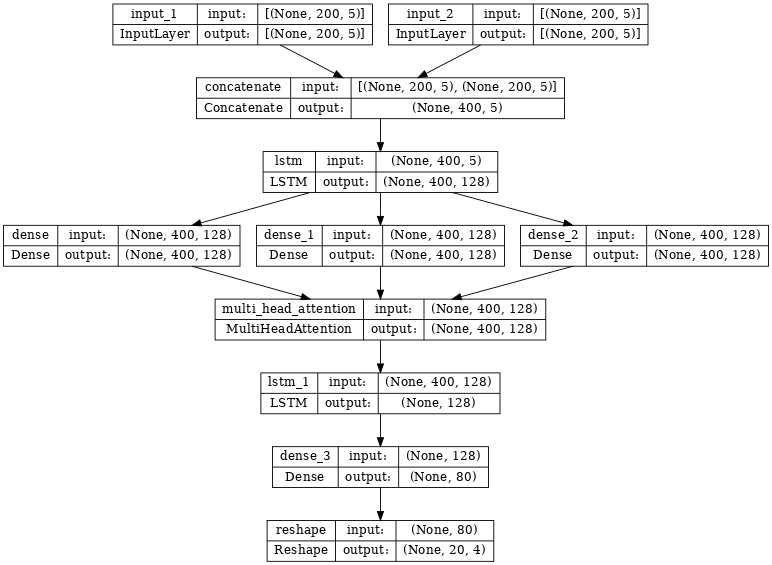

In [9]:
# Define input shape
input_shape = (200, 5)


# Input layer
inputs1 = Input(shape=input_shape)

inputs2 = Input(shape=input_shape)
merged_input = Concatenate(axis=1)([inputs1, inputs2])
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(merged_input)
query_projection = Dense(128)(lstm1)
key_projection = Dense(128)(lstm1)
value_projection = Dense(128)(lstm1)
attention = MultiHeadAttention(num_heads=8, key_dim=128)(query_projection, key_projection, value_projection)

output = LSTM(units=128, activation='tanh')(attention)
output = Dense(80)(output)
reshaped_output = Reshape((20, 4))(output)

AMZN_lstm_model_v_a = Model(inputs=[inputs1, inputs2], outputs=reshaped_output)
AMZN_lstm_model_v_a.compile(optimizer=Adam(learning_rate=0.0002), loss='mse')
AMZN_lstm_model_v_a.summary()

tf.keras.utils.plot_model(AMZN_lstm_model_v_a, show_shapes=True, dpi=64)

Epoch 1/15


2023-12-11 21:55:34.798945: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8902
2023-12-11 21:55:36.134107: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fa700346060 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-12-11 21:55:36.134170: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA A40, Compute Capability 8.6
2023-12-11 21:55:36.138587: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-12-11 21:55:36.301522: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 [==============================] - 0s 32ms/step


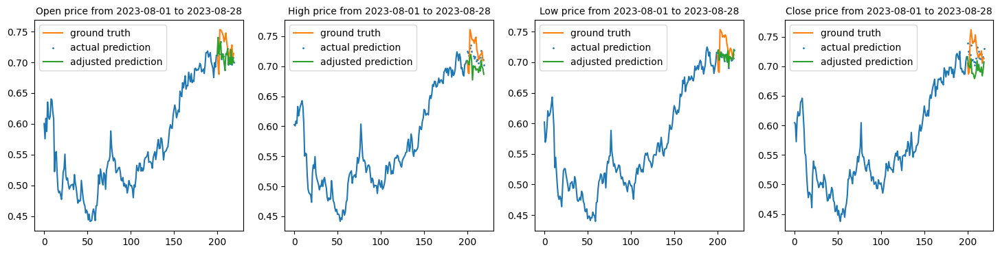

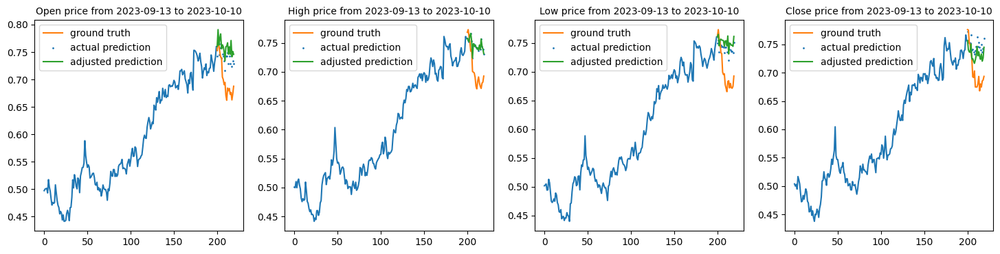

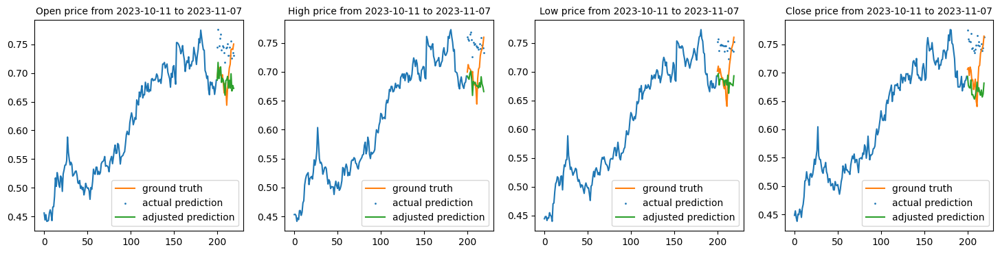

5722/5722 [==============================] - 121s 20ms/step - loss: 0.0053 - val_loss: 0.0021
Epoch 2/15
1/1 [==============================] - 0s 44ms/step


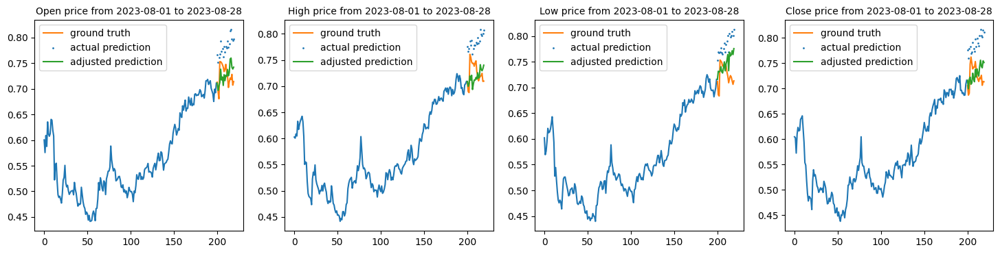

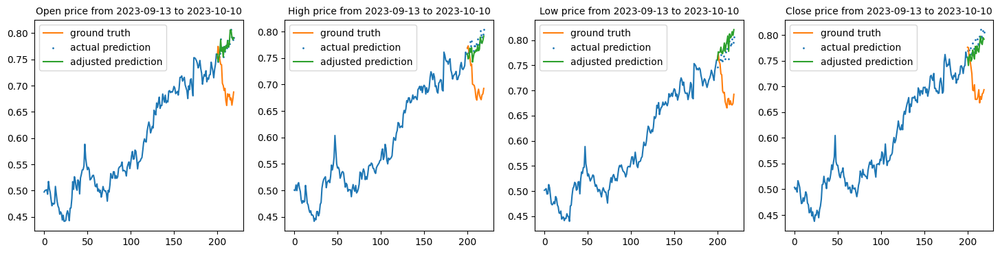

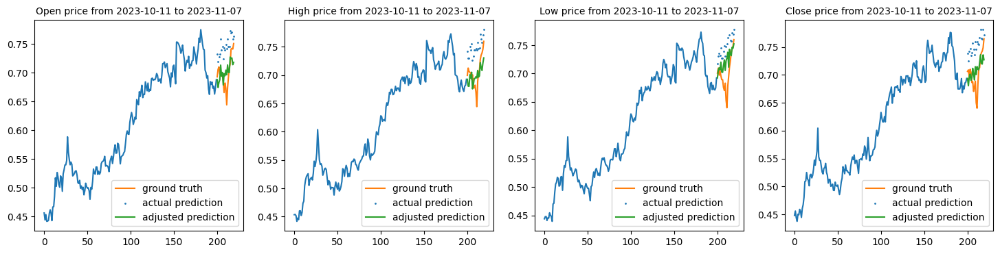

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0030 - val_loss: 0.0049
Epoch 3/15
1/1 [==============================] - 0s 36ms/step


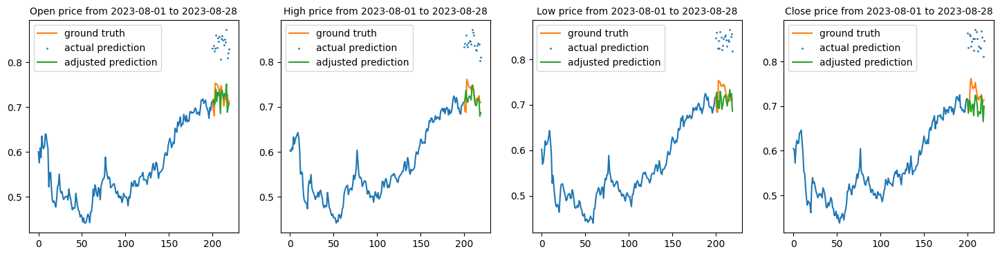

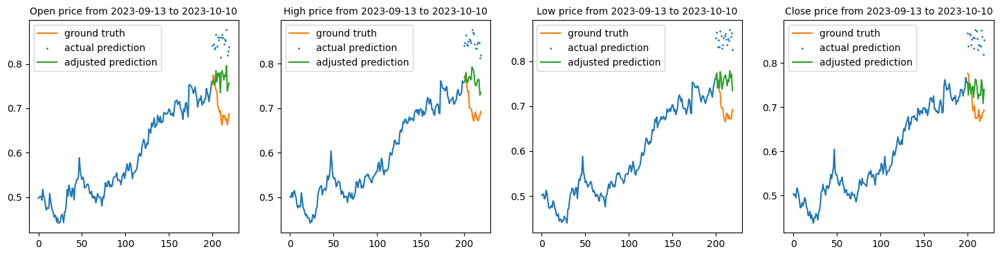

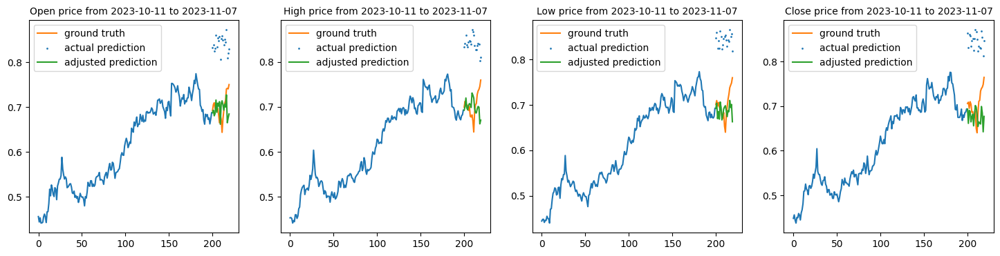

5722/5722 [==============================] - 114s 20ms/step - loss: 0.0019 - val_loss: 0.0192
Epoch 4/15
1/1 [==============================] - 0s 34ms/step


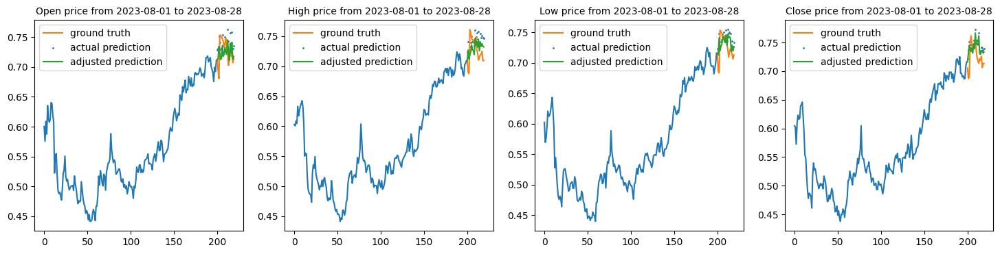

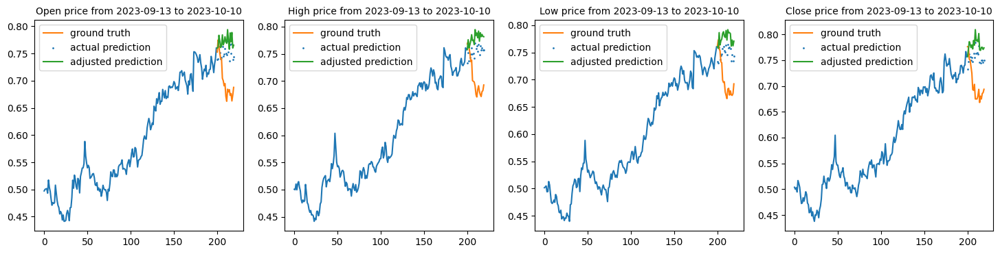

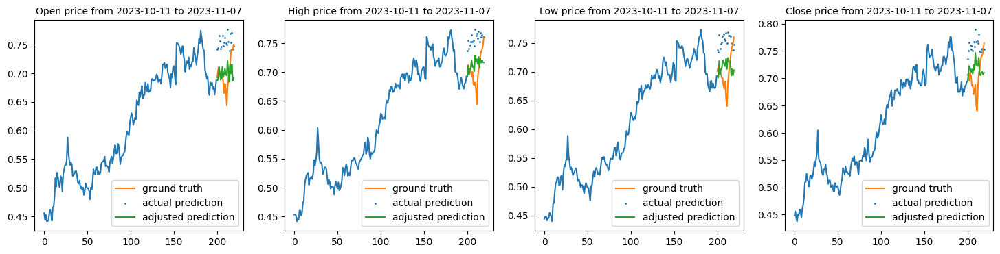

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0018 - val_loss: 0.0029
Epoch 5/15
1/1 [==============================] - 0s 70ms/step


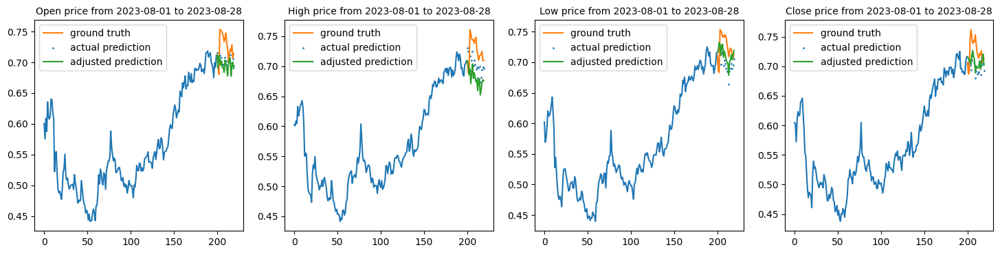

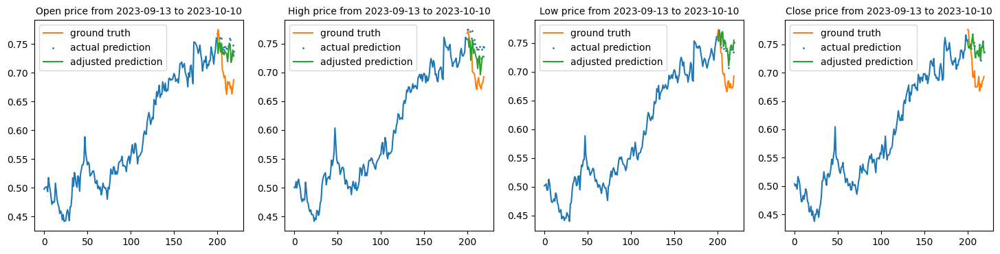

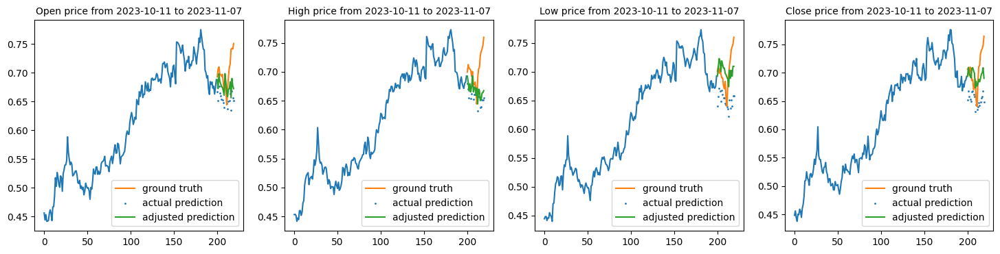

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 6/15
1/1 [==============================] - 0s 47ms/step


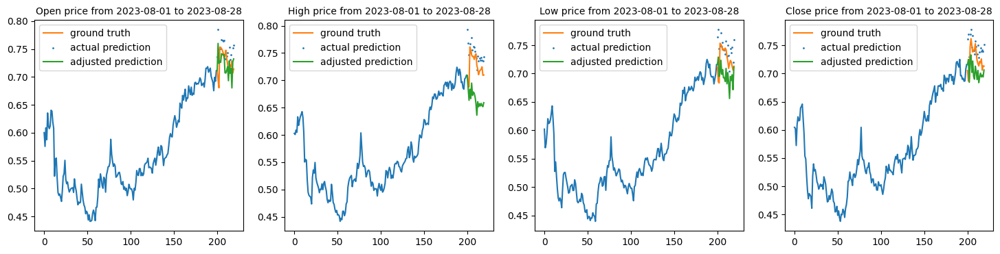

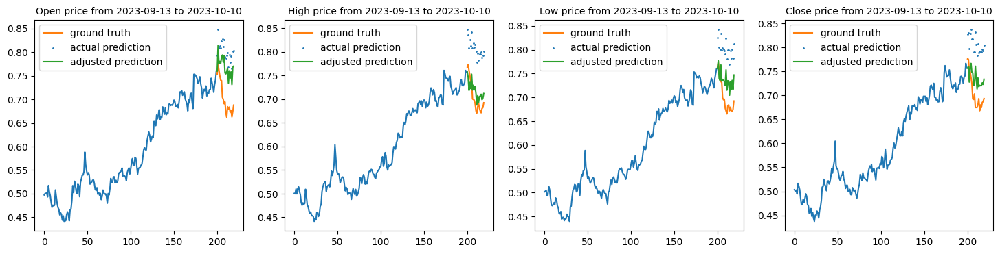

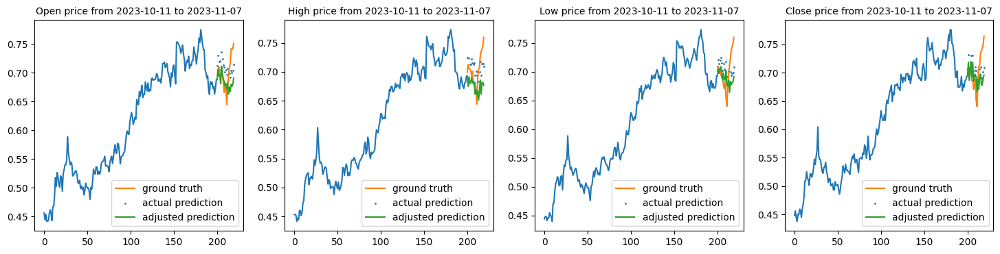

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0013 - val_loss: 0.0043
Epoch 7/15
1/1 [==============================] - 0s 35ms/step


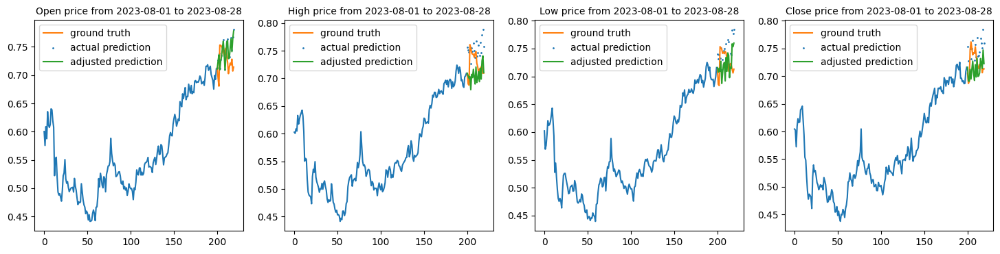

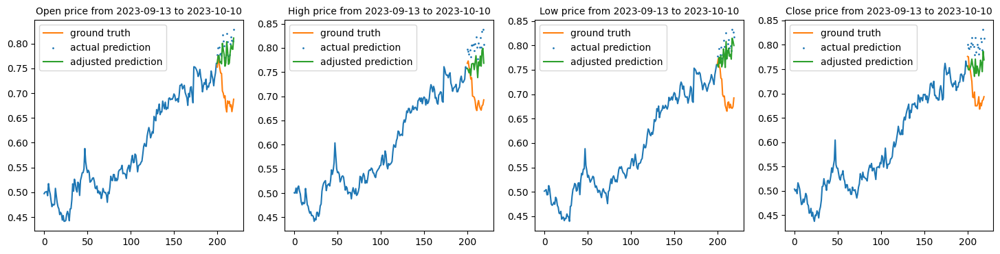

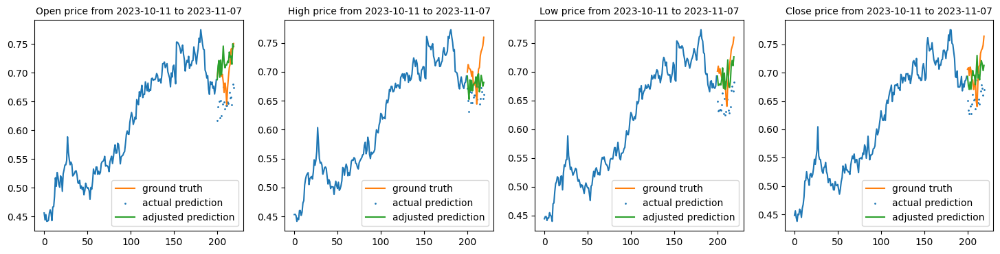

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0015 - val_loss: 0.0052
Epoch 8/15
1/1 [==============================] - 0s 32ms/step


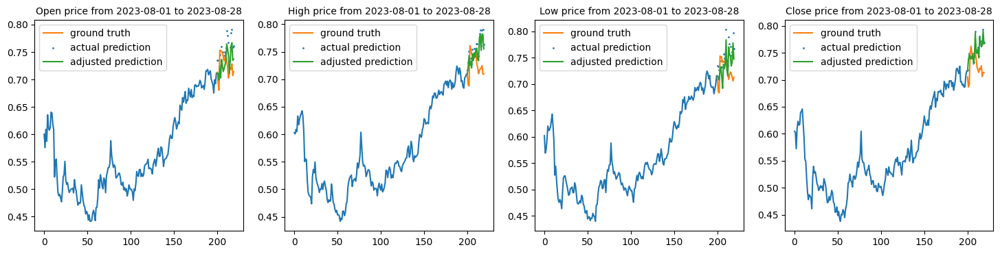

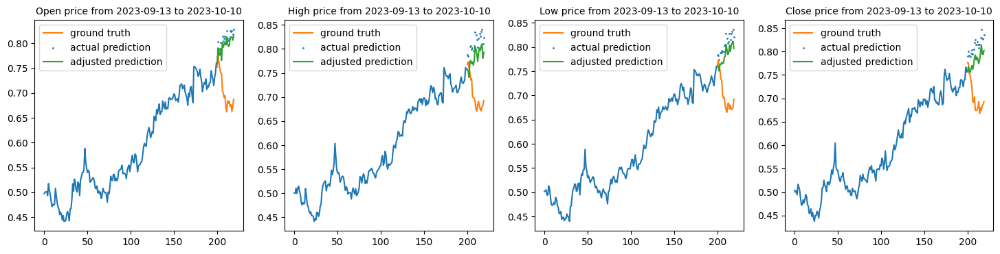

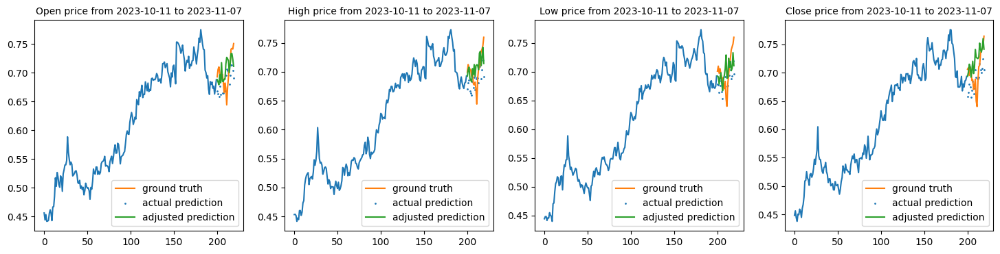

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0011 - val_loss: 0.0055
Epoch 9/15
1/1 [==============================] - 0s 37ms/step


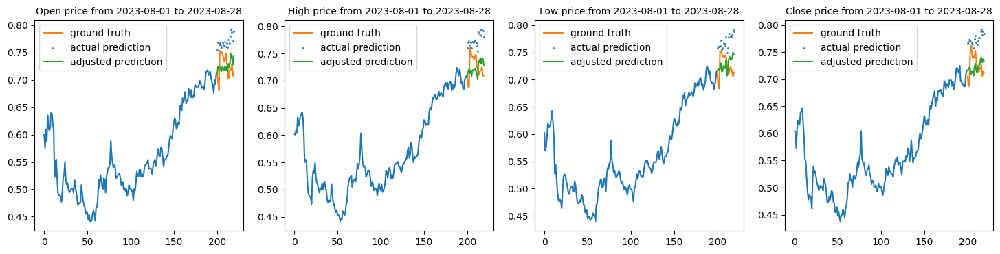

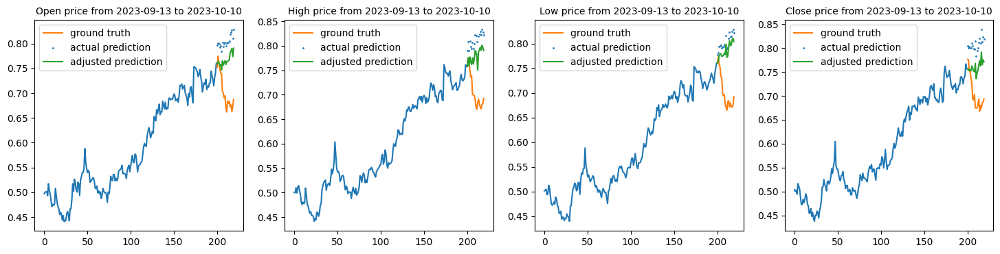

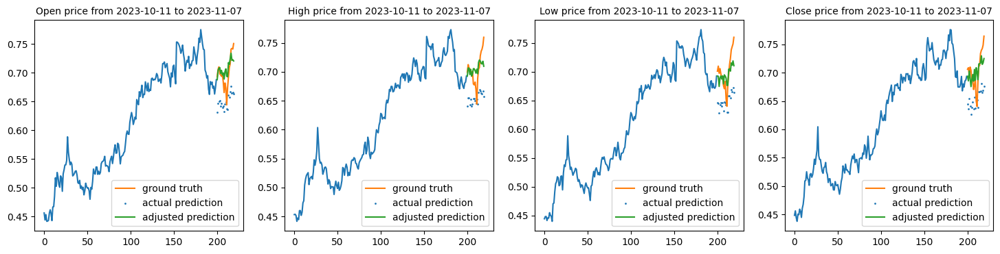

5722/5722 [==============================] - 117s 20ms/step - loss: 9.4520e-04 - val_loss: 0.0060
Epoch 10/15
1/1 [==============================] - 0s 40ms/step


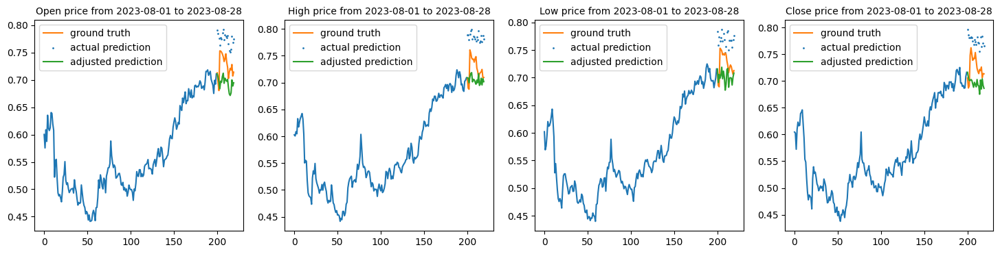

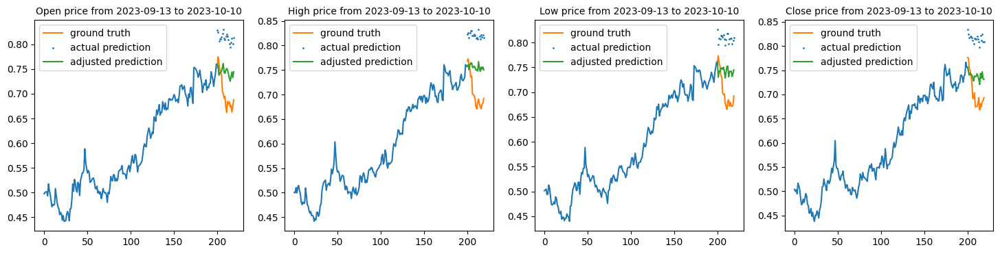

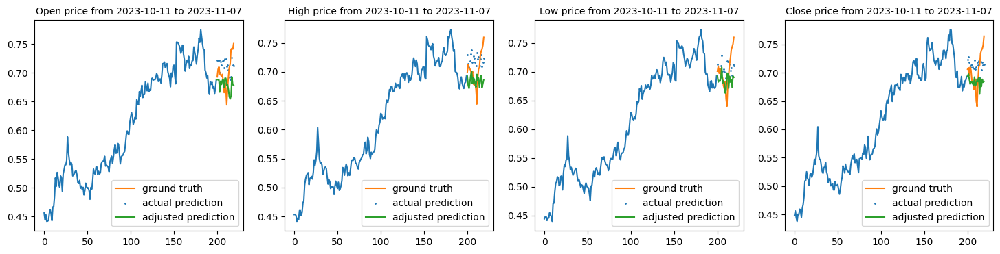

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0013 - val_loss: 0.0058
Epoch 11/15
1/1 [==============================] - 0s 83ms/step


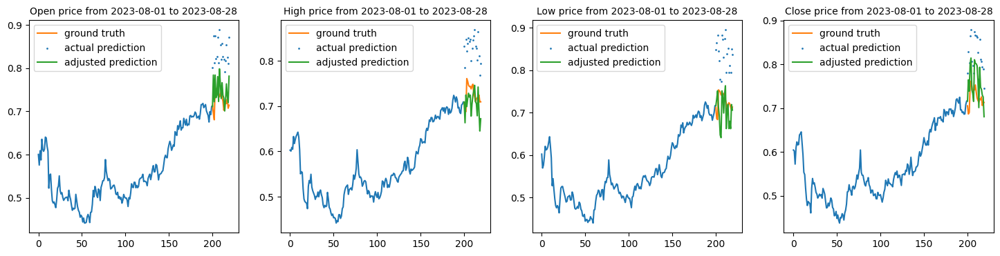

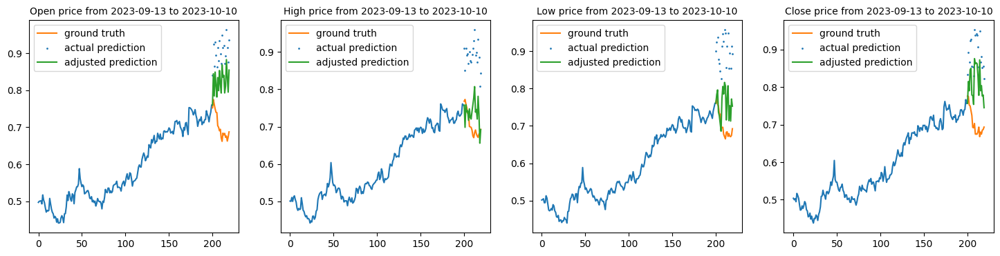

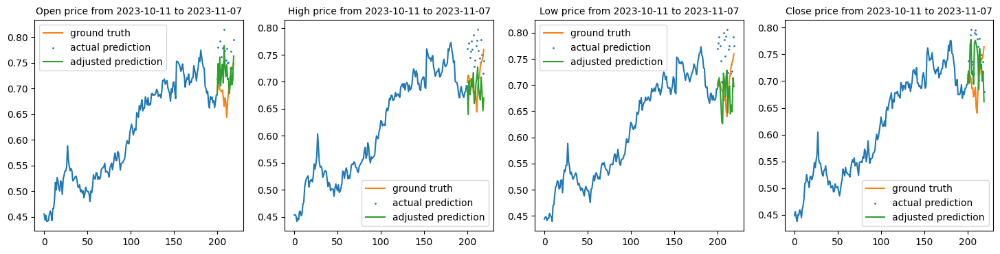

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0014 - val_loss: 0.0190
Epoch 12/15
1/1 [==============================] - 0s 35ms/step


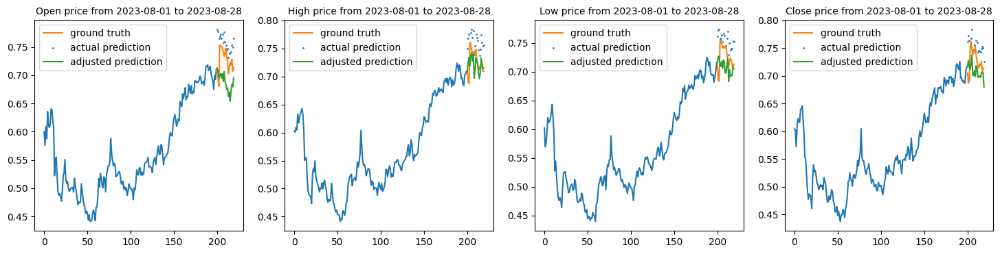

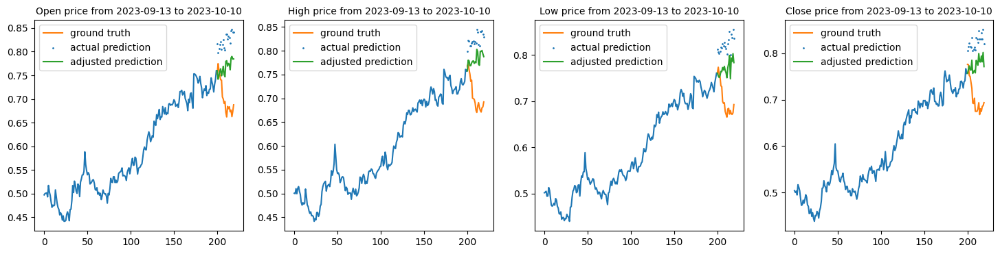

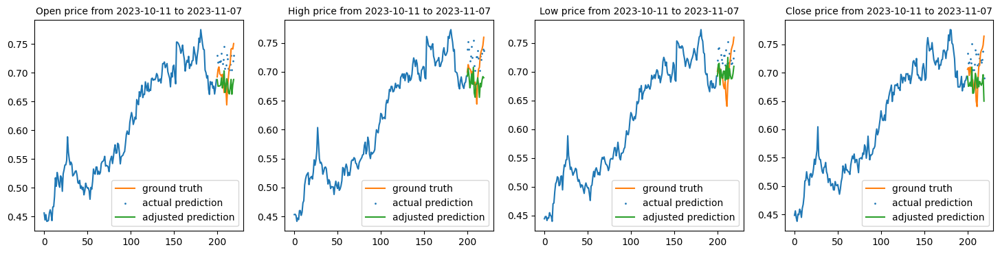

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0010 - val_loss: 0.0064
Epoch 13/15
1/1 [==============================] - 0s 36ms/step


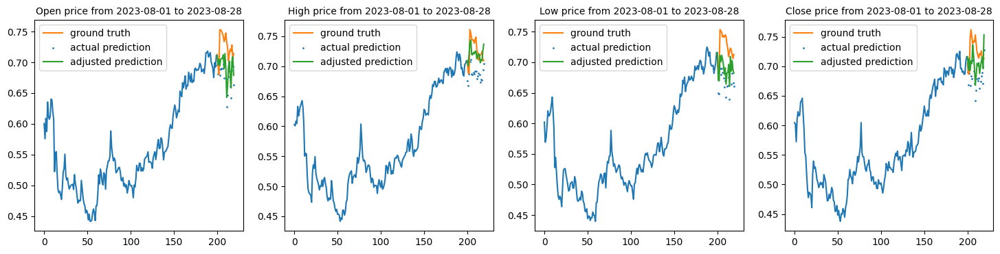

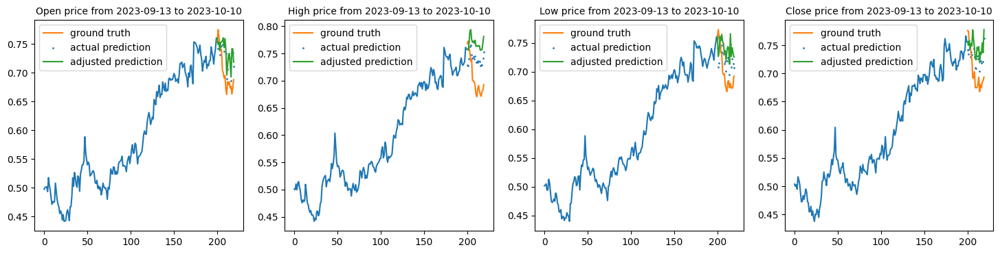

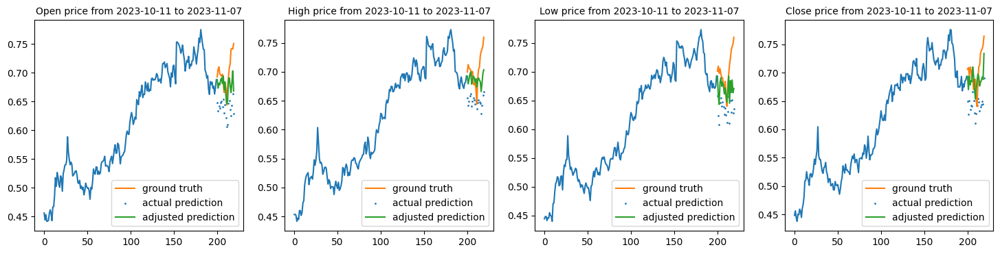

5722/5722 [==============================] - 120s 21ms/step - loss: 9.2249e-04 - val_loss: 0.0030
Epoch 14/15
1/1 [==============================] - 0s 44ms/step


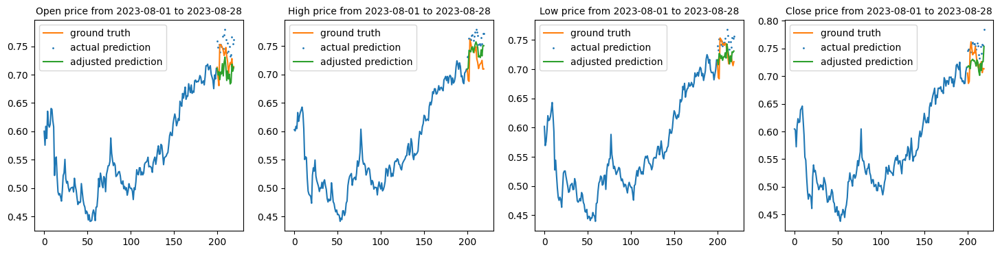

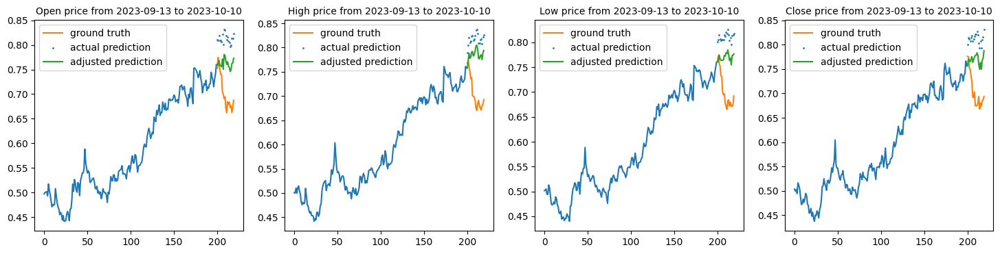

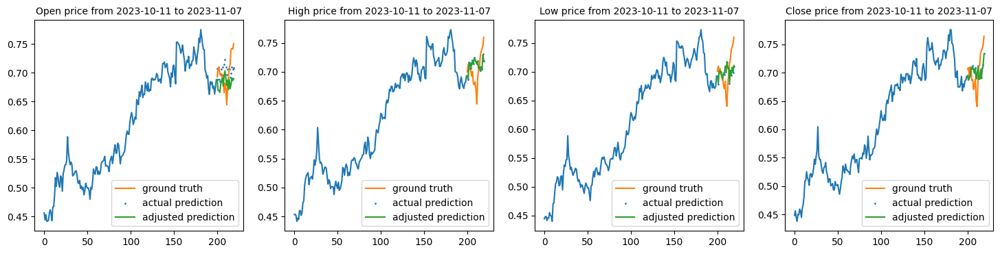

5722/5722 [==============================] - 118s 21ms/step - loss: 8.8697e-04 - val_loss: 0.0052
Epoch 15/15
1/1 [==============================] - 0s 56ms/step


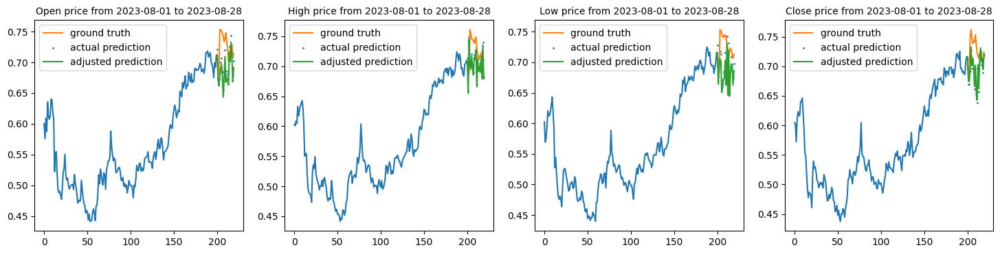

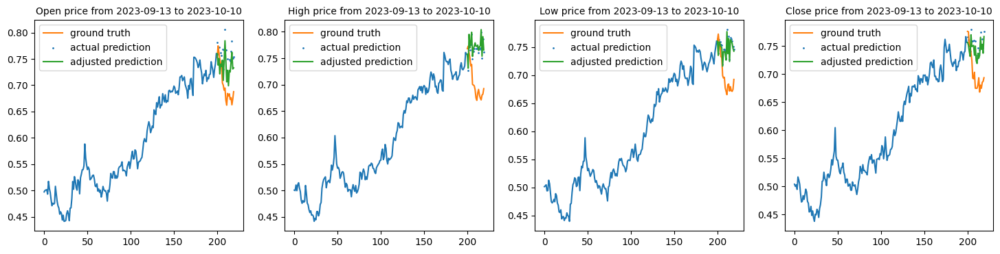

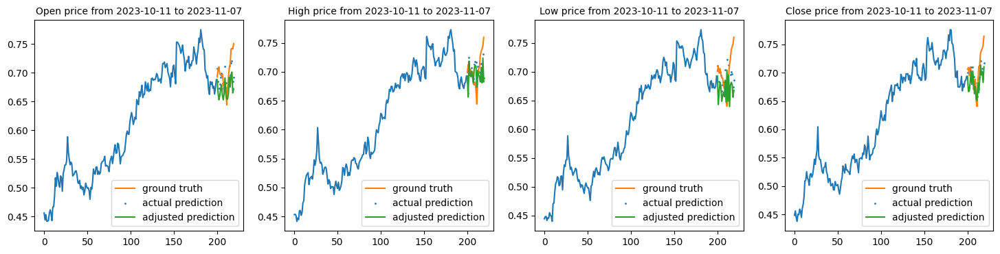

5722/5722 [==============================] - 117s 20ms/step - loss: 8.2428e-04 - val_loss: 0.0023
[0.0020562412682920694, 0.004915096331387758, 0.01920202374458313, 0.0029008768033236265, 0.002356217009946704, 0.004285694565623999, 0.005204891785979271, 0.005450867116451263, 0.00604903744533658, 0.005811805371195078, 0.018980074673891068, 0.006403585430234671, 0.0030187349766492844, 0.005192080978304148, 0.002330879680812359]
[0.005345513112843037, 0.0029727844521403313, 0.0018620287301018834, 0.0017751770792528987, 0.001497983350418508, 0.0013008732348680496, 0.0015333336777985096, 0.0010886727832257748, 0.0009452020167373121, 0.0012678873026743531, 0.00135827308986336, 0.0010081757791340351, 0.000922487466596067, 0.0008869727025739849, 0.0008242763578891754]


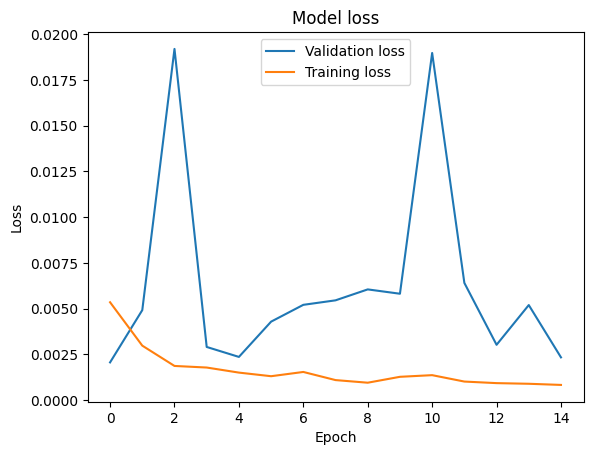

In [10]:
AMZN_lstm_model_v_a_callback = CustomCallback2(AMZN_lstm_model_v_a, AMZN_x_test[:,:,:], SPX_x_test[:,:,:], AMZN_y_test[:,:,:5])
AMZN_lstm_model_v_a_history = AMZN_lstm_model_v_a.fit([AMZN_x_train[:,:,1:].astype('float32'), SPX_x_train[:,:,1:].astype('float32')], AMZN_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[AMZN_lstm_model_v_a_callback], validation_data=([AMZN_x_test[:,:,1:].astype('float32'), SPX_x_test[:,:,1:].astype('float32')], AMZN_y_test[:,:,1:5].astype('float32')))

print(AMZN_lstm_model_v_a_history.history['val_loss'])
print(AMZN_lstm_model_v_a_history.history['loss'])

plt.plot(AMZN_lstm_model_v_a_history.history['val_loss'])
plt.plot(AMZN_lstm_model_v_a_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()

## LSTM Model with Attention layer and Auxilary Input - DUK

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 200, 5)]             0         []                            
                                                                                                  
 input_8 (InputLayer)        [(None, 200, 5)]             0         []                            
                                                                                                  
 concatenate_3 (Concatenate  (None, 400, 5)               0         ['input_7[0][0]',             
 )                                                                   'input_8[0][0]']             
                                                                                                  
 lstm_6 (LSTM)               (None, 400, 128)             68608     ['concatenate_3[0][0]'] 

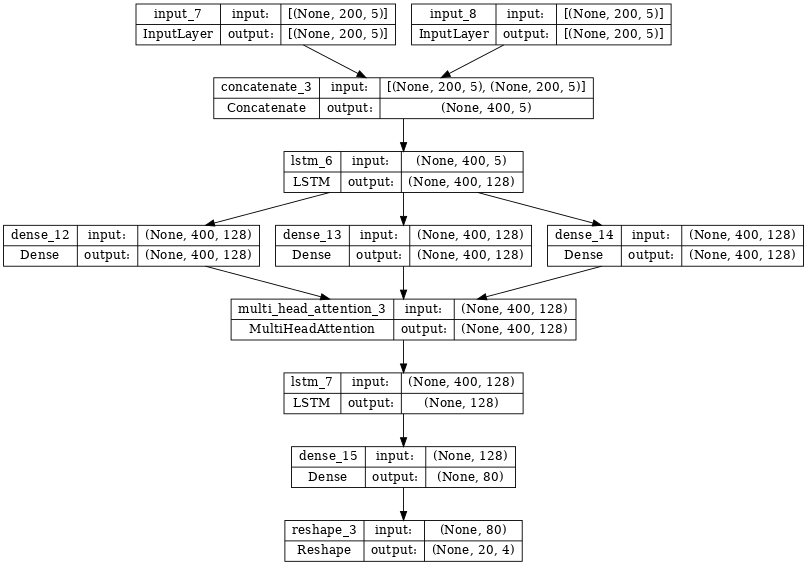

In [15]:
# Define input shape
input_shape = (200, 5)


# Input layer
inputs1 = Input(shape=input_shape)

inputs2 = Input(shape=input_shape)
merged_input = Concatenate(axis=1)([inputs1, inputs2])
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(merged_input)
query_projection = Dense(128)(lstm1)
key_projection = Dense(128)(lstm1)
value_projection = Dense(128)(lstm1)
attention = MultiHeadAttention(num_heads=8, key_dim=128)(query_projection, key_projection, value_projection)

output = LSTM(units=128, activation='tanh')(attention)
output = Dense(80)(output)
reshaped_output = Reshape((20, 4))(output)

DUK_lstm_model_v_a = Model(inputs=[inputs1, inputs2], outputs=reshaped_output)
DUK_lstm_model_v_a.compile(optimizer=Adam(learning_rate=0.0002), loss='mse')
DUK_lstm_model_v_a.summary()

tf.keras.utils.plot_model(DUK_lstm_model_v_a, show_shapes=True, dpi=64)

Epoch 1/15
 155/5722 [..............................] - ETA: 1:46 - loss: 0.0430

1/1 [==============================] - 0s 56ms/step


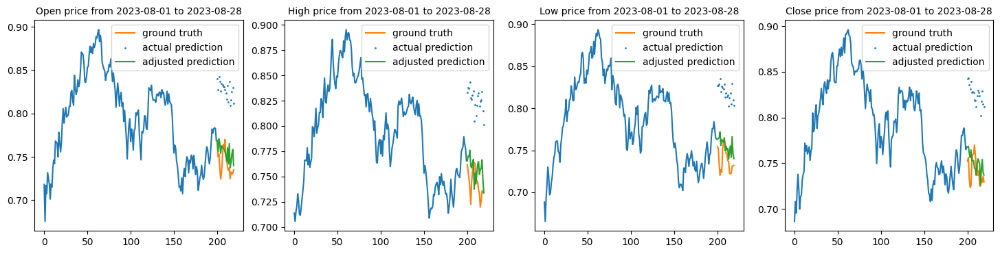

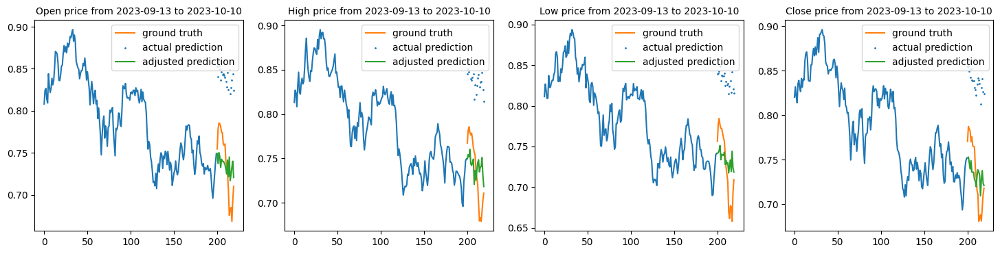

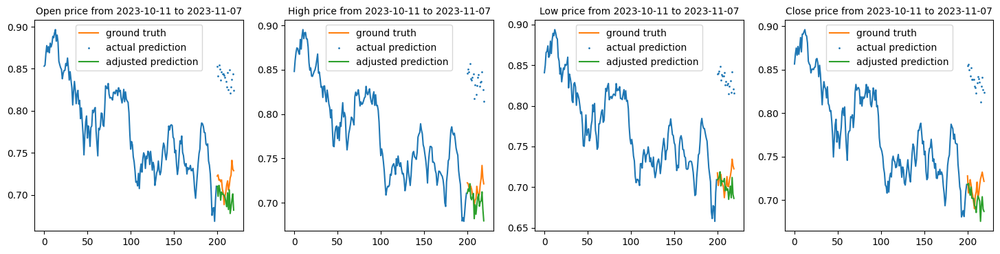

5722/5722 [==============================] - 121s 21ms/step - loss: 0.0056 - val_loss: 0.0113
Epoch 2/15
1/1 [==============================] - 0s 26ms/step


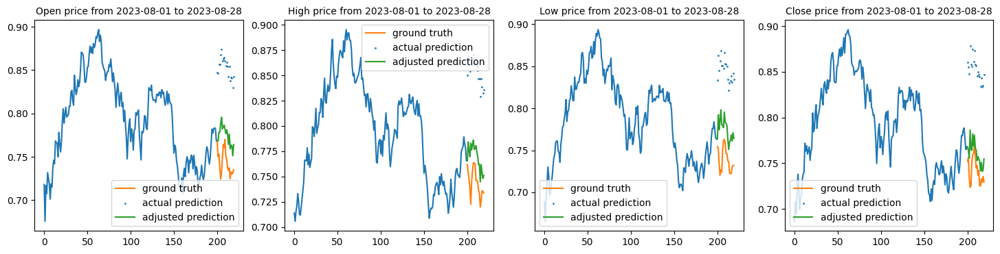

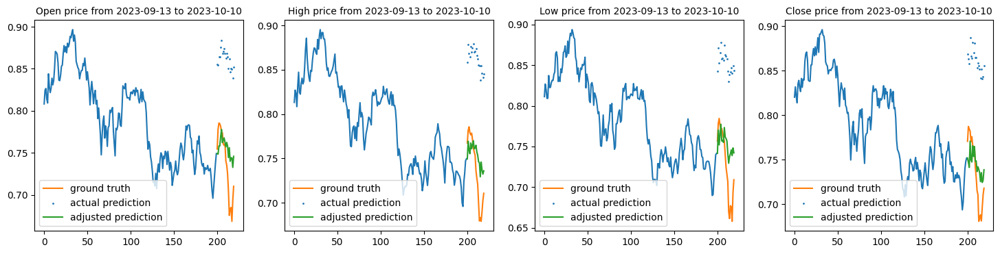

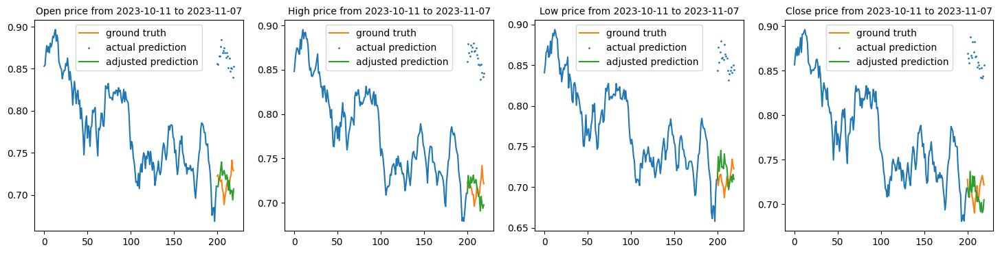

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0031 - val_loss: 0.0169
Epoch 3/15
1/1 [==============================] - 0s 30ms/step


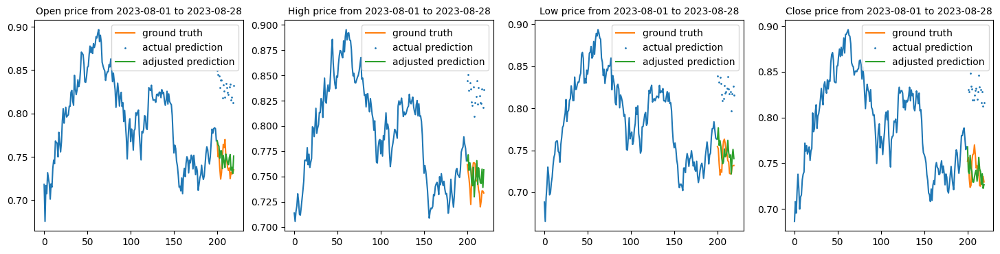

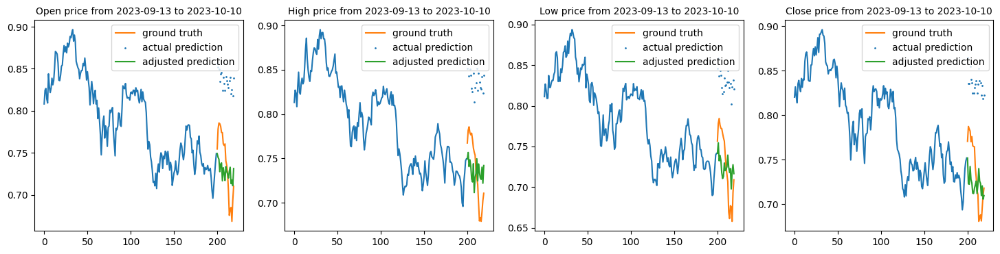

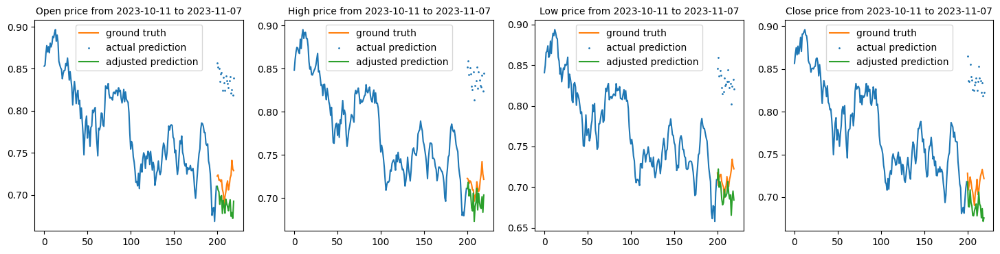

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0027 - val_loss: 0.0113
Epoch 4/15
1/1 [==============================] - 0s 42ms/step


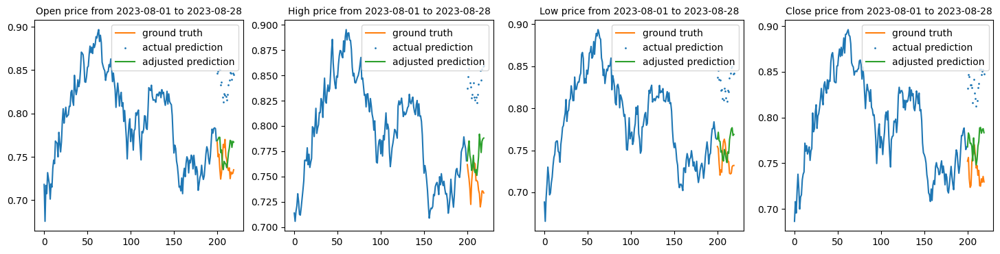

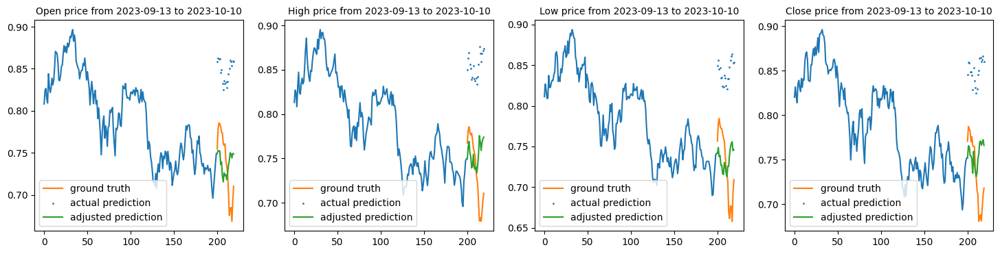

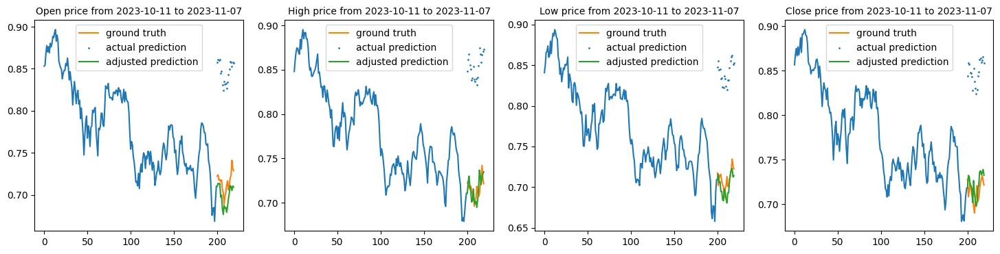

5722/5722 [==============================] - 118s 21ms/step - loss: 0.0023 - val_loss: 0.0141
Epoch 5/15
1/1 [==============================] - 0s 60ms/step


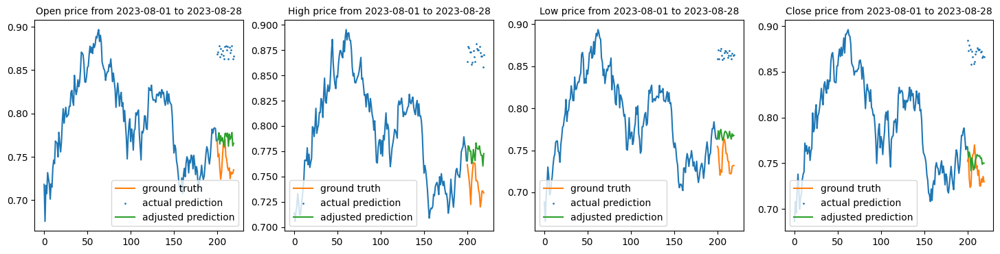

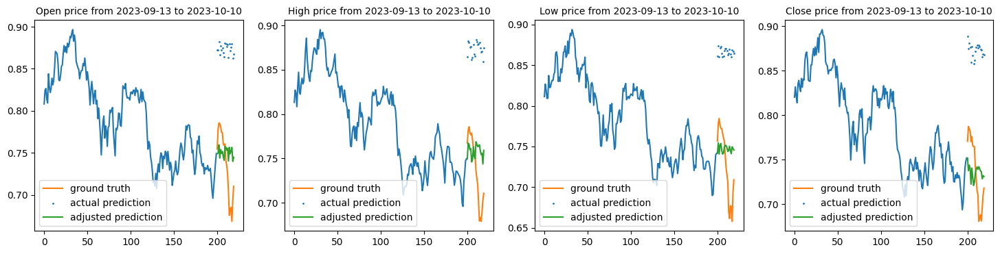

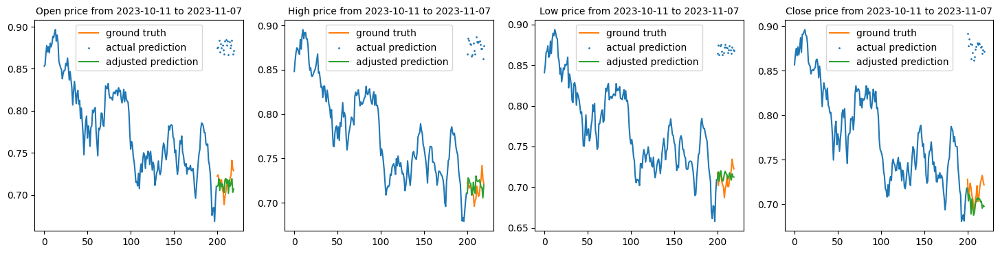

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0021 - val_loss: 0.0209
Epoch 6/15
1/1 [==============================] - 0s 37ms/step


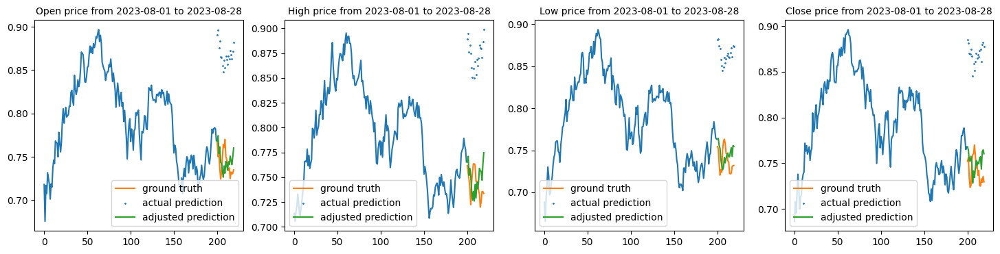

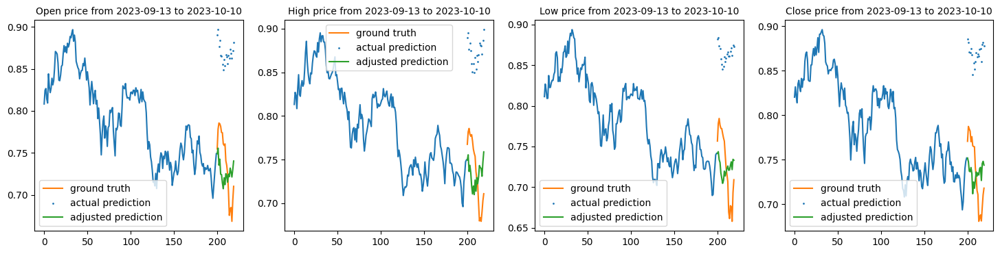

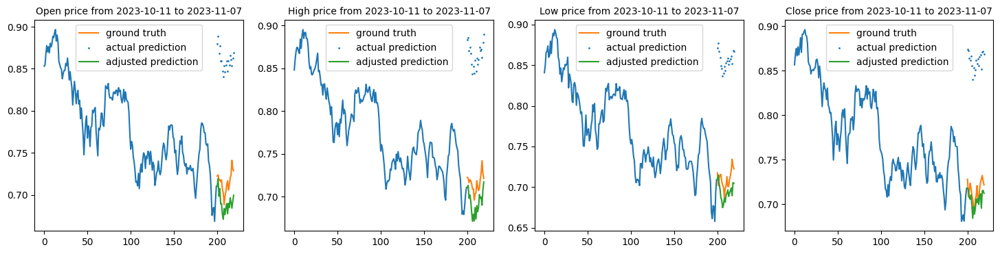

5722/5722 [==============================] - 115s 20ms/step - loss: 0.0019 - val_loss: 0.0193
Epoch 7/15
1/1 [==============================] - 0s 53ms/step


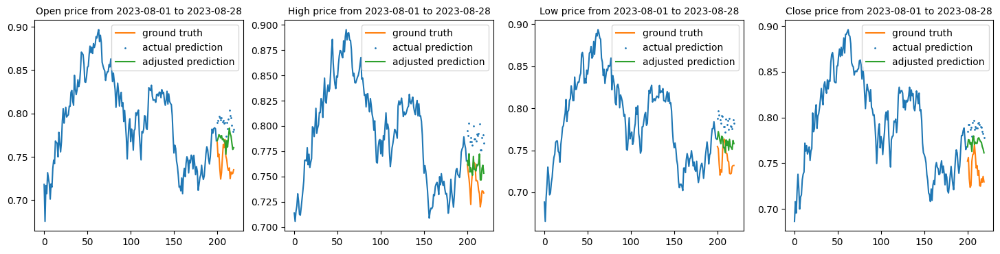

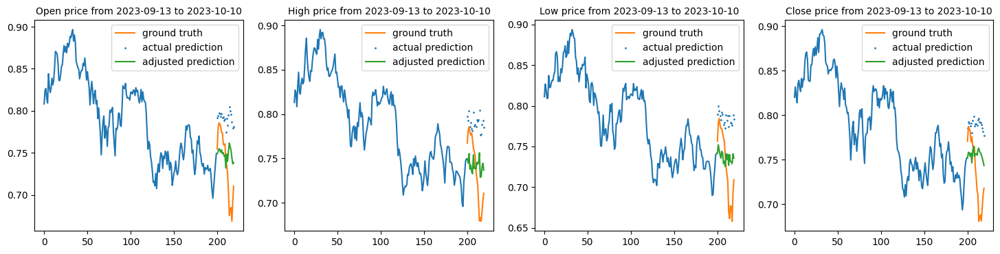

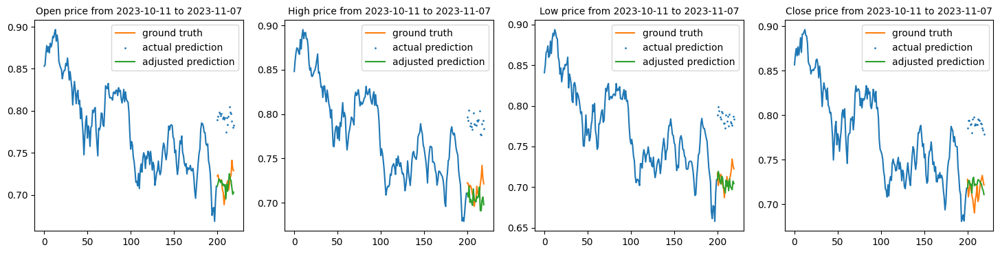

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0018 - val_loss: 0.0042
Epoch 8/15
1/1 [==============================] - 0s 42ms/step


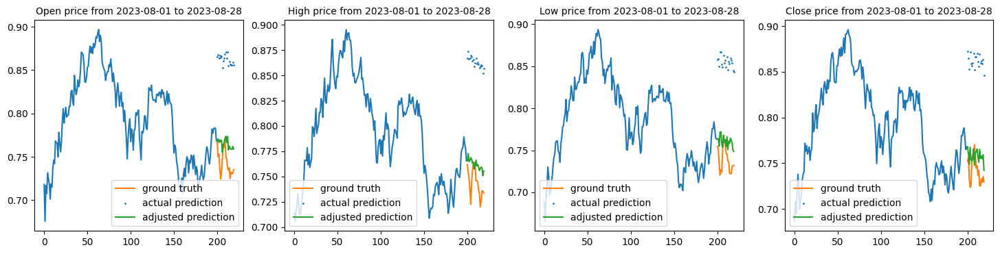

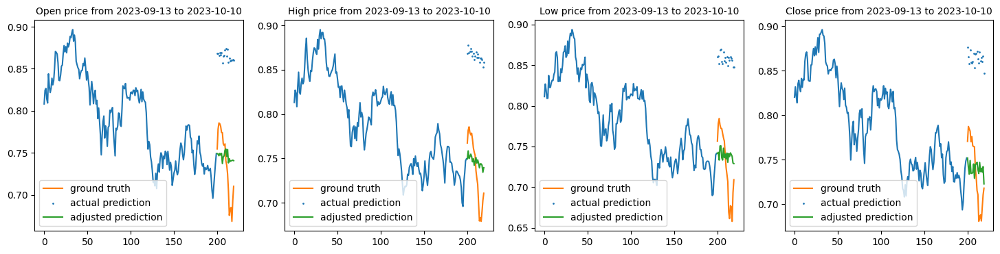

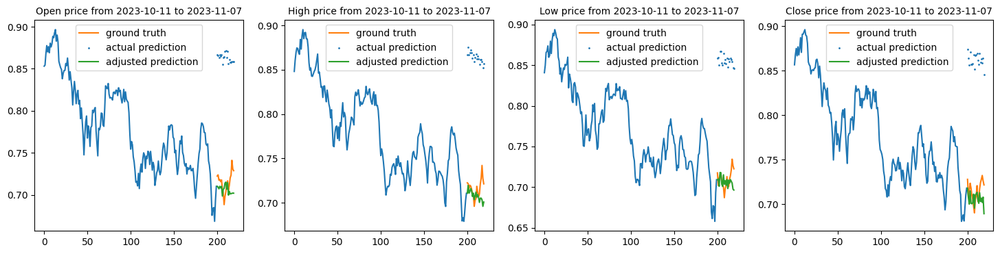

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0033 - val_loss: 0.0180
Epoch 9/15
1/1 [==============================] - 0s 29ms/step


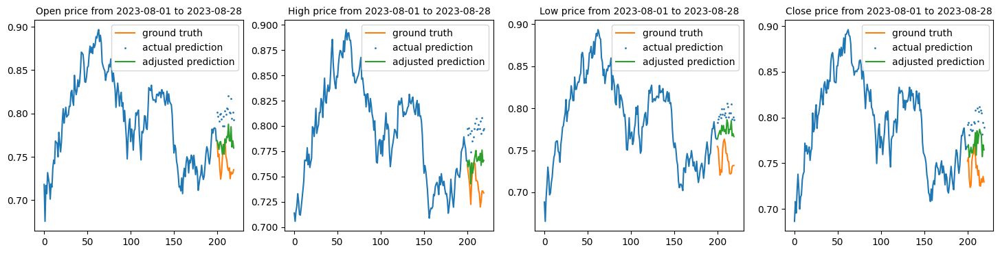

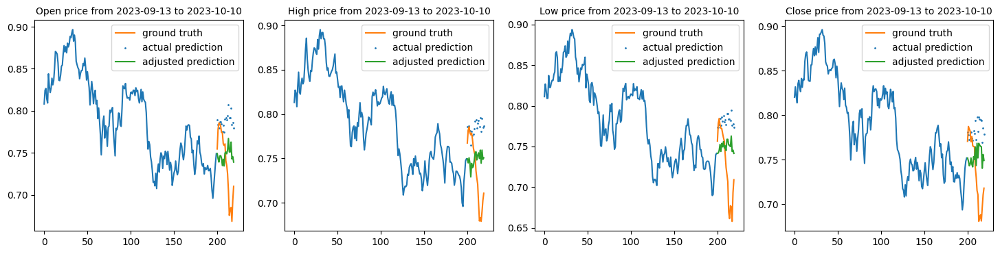

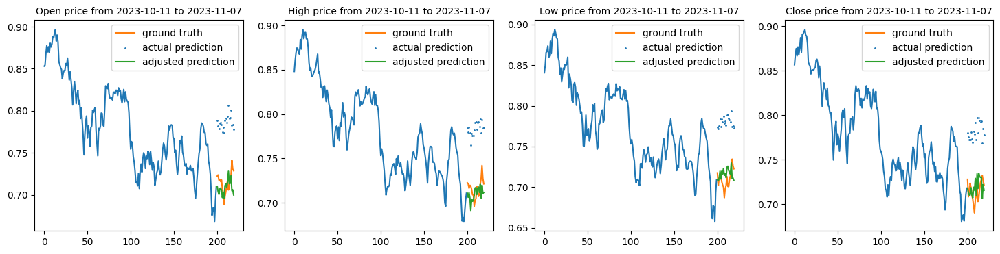

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0019 - val_loss: 0.0042
Epoch 10/15
1/1 [==============================] - 0s 30ms/step


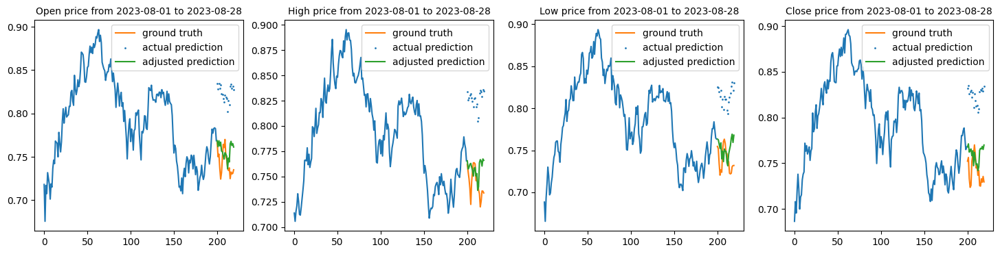

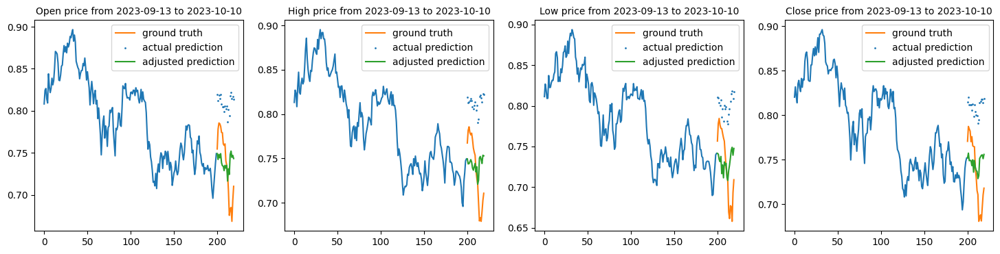

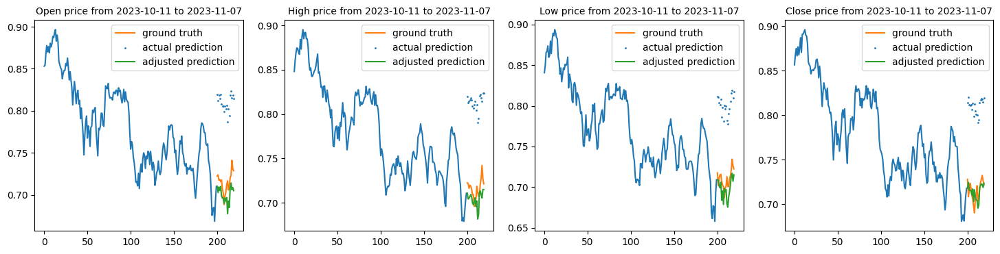

5722/5722 [==============================] - 115s 20ms/step - loss: 0.0016 - val_loss: 0.0076
Epoch 11/15
1/1 [==============================] - 0s 46ms/step


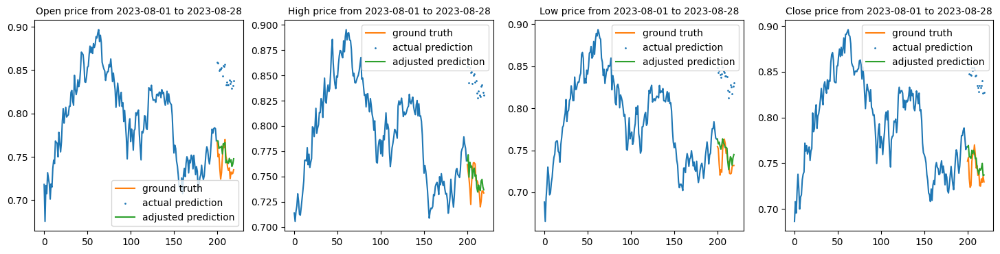

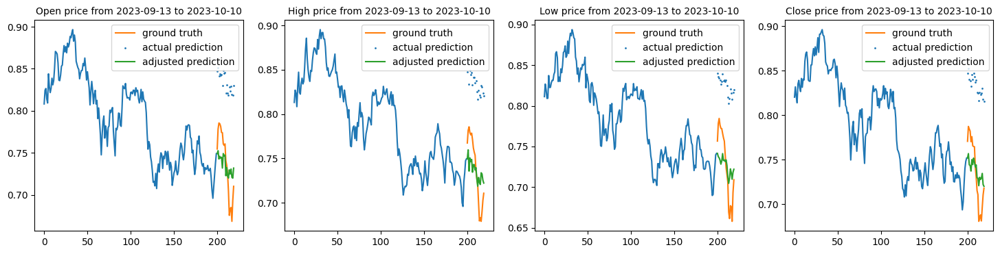

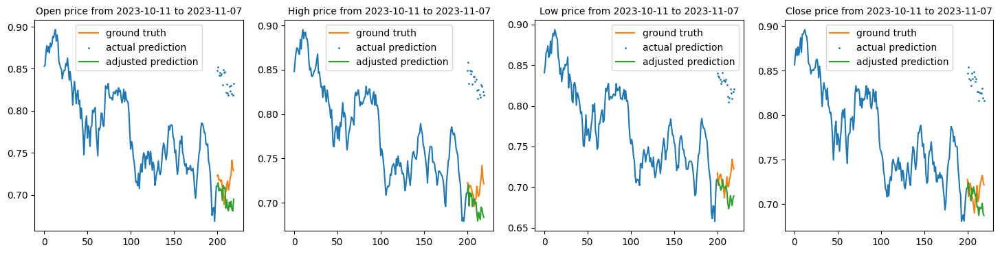

5722/5722 [==============================] - 117s 20ms/step - loss: 0.0014 - val_loss: 0.0115
Epoch 12/15
1/1 [==============================] - 0s 60ms/step


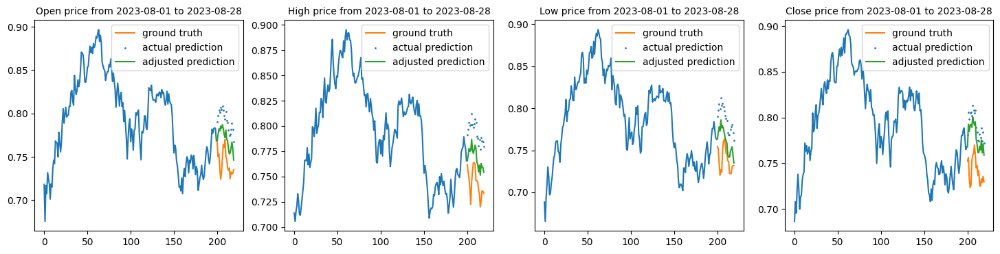

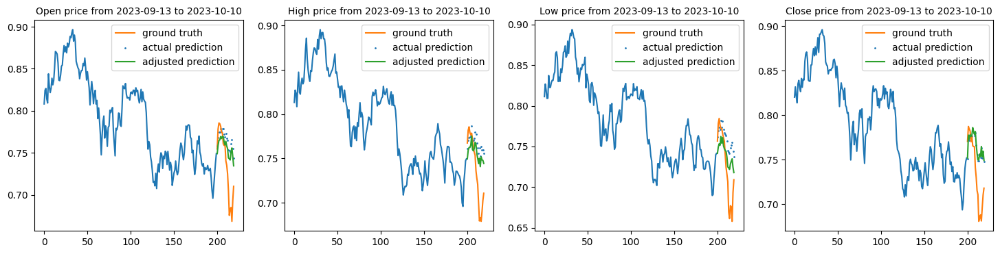

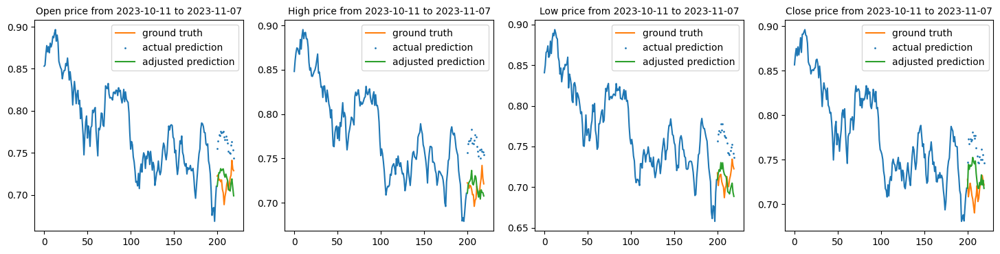

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 13/15
1/1 [==============================] - 0s 37ms/step


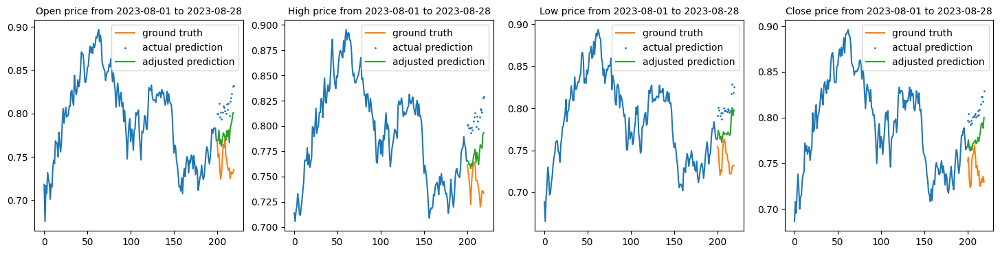

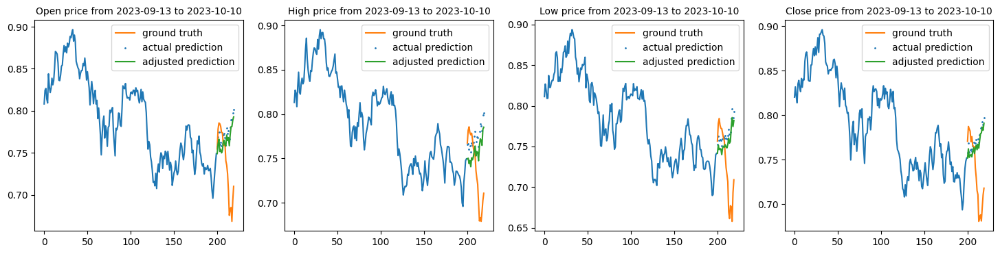

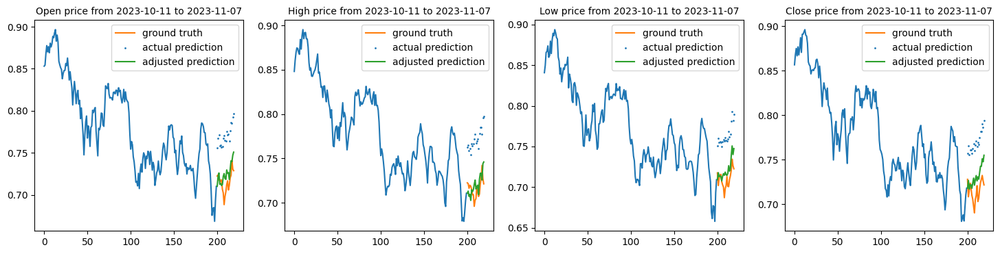

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0012 - val_loss: 0.0038
Epoch 14/15
1/1 [==============================] - 0s 35ms/step


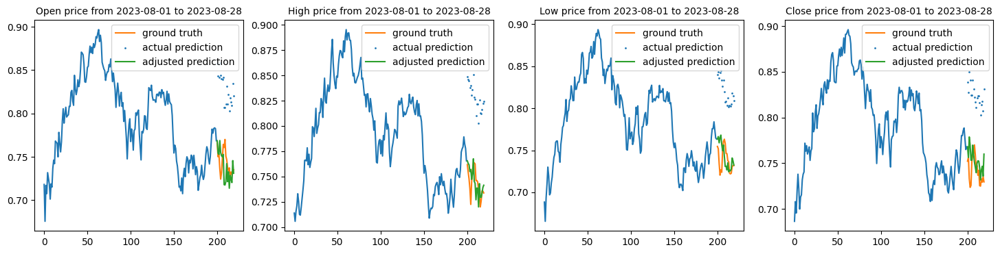

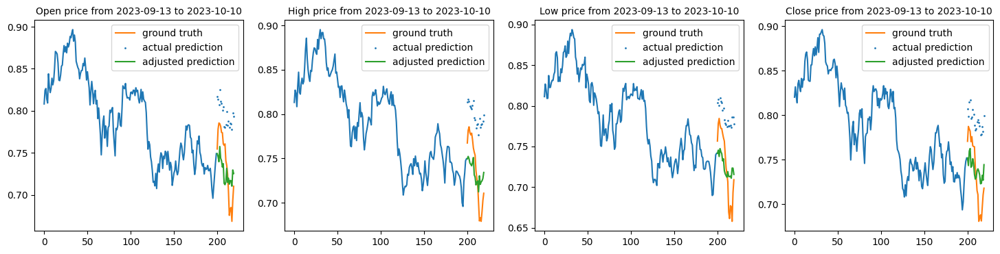

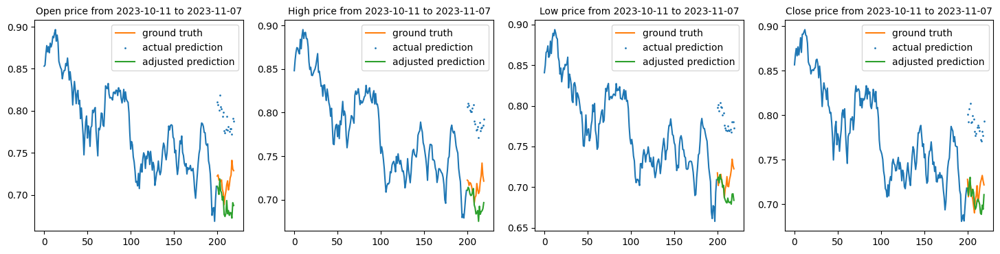

5722/5722 [==============================] - 114s 20ms/step - loss: 0.0011 - val_loss: 0.0059
Epoch 15/15
1/1 [==============================] - 0s 30ms/step


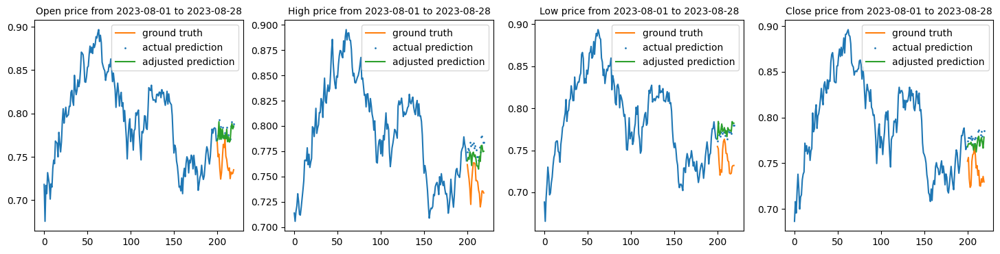

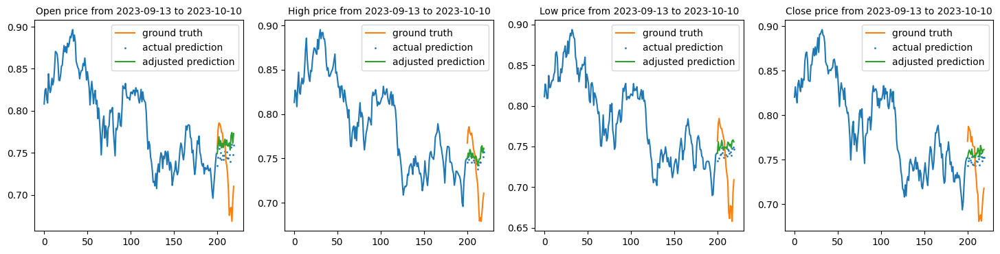

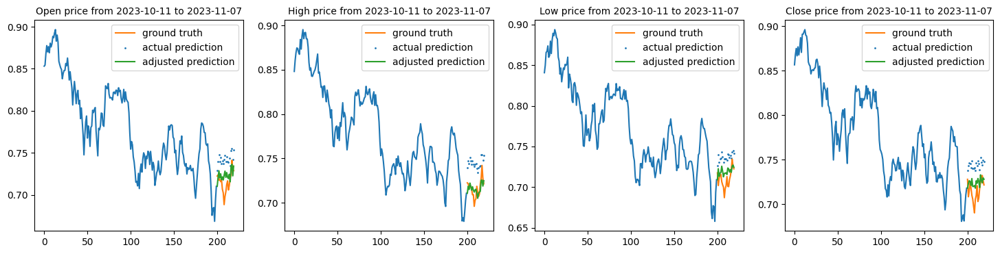

5722/5722 [==============================] - 115s 20ms/step - loss: 0.0011 - val_loss: 0.0014
[0.011258014477789402, 0.016857385635375977, 0.0113329216837883, 0.014050237834453583, 0.02088693343102932, 0.01928587257862091, 0.004195604473352432, 0.017999527975916862, 0.004168693441897631, 0.007596062496304512, 0.011538022197782993, 0.0023800788912922144, 0.0037792923394590616, 0.005853670183569193, 0.0014037237269803882]
[0.005590633489191532, 0.0030785161070525646, 0.0026611448265612125, 0.0023147589527070522, 0.00212471722625196, 0.0019180475501343608, 0.00177193118724972, 0.0032874050084501505, 0.0018531884998083115, 0.0015868847258388996, 0.0013751109363511205, 0.0012645652750506997, 0.0012171148555353284, 0.001127414172515273, 0.0010583677794784307]


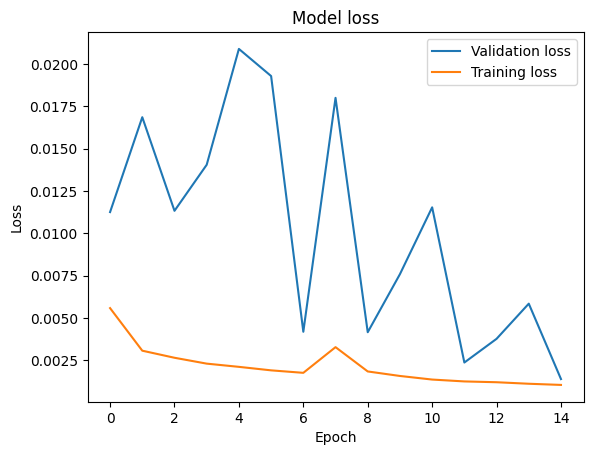

In [16]:
DUK_lstm_model_v_a_callback  = CustomCallback2(DUK_lstm_model_v_a, DUK_x_test, SPX_x_test, DUK_y_test)
duk_history = DUK_lstm_model_v_a.fit([DUK_x_train[:,:,1:].astype('float32'), SPX_x_train[:,:,1:].astype('float32')], DUK_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[DUK_lstm_model_v_a_callback], validation_data=([DUK_x_test[:,:,1:].astype('float32'), SPX_x_test[:,:,1:].astype('float32')], DUK_y_test[:,:,1:5].astype('float32')))


print(duk_history.history['val_loss'])
print(duk_history.history['loss'])

plt.plot(duk_history.history['val_loss'])
plt.plot(duk_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()

## LSTM Model with Attention layer and Auxiliary Input - AAPL

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 200, 5)]             0         []                            
                                                                                                  
 input_10 (InputLayer)       [(None, 200, 5)]             0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 400, 5)               0         ['input_9[0][0]',             
 )                                                                   'input_10[0][0]']            
                                                                                                  
 lstm_8 (LSTM)               (None, 400, 128)             68608     ['concatenate_4[0][0]'] 

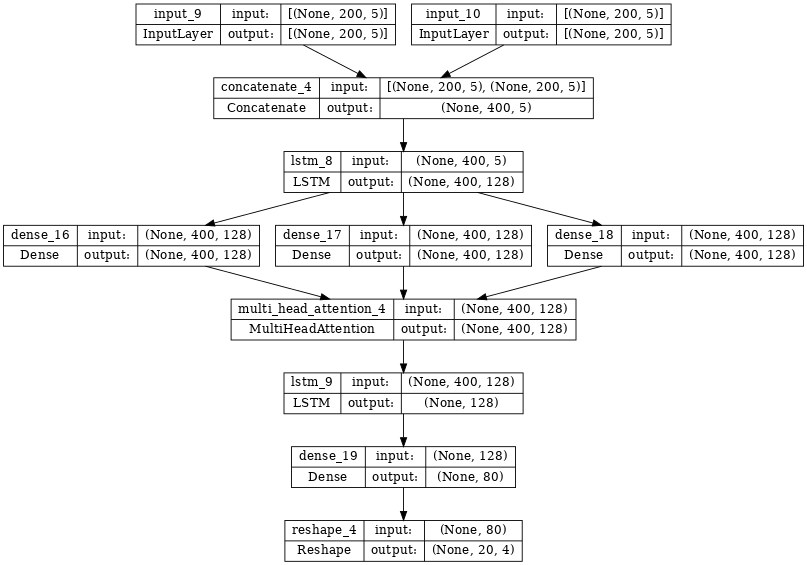

In [17]:
# Define input shape
input_shape = (200, 5)


# Input layer
inputs1 = Input(shape=input_shape)

inputs2 = Input(shape=input_shape)
merged_input = Concatenate(axis=1)([inputs1, inputs2])
lstm1 = LSTM(units=128, activation='tanh', return_sequences=True)(merged_input)
query_projection = Dense(128)(lstm1)
key_projection = Dense(128)(lstm1)
value_projection = Dense(128)(lstm1)
attention = MultiHeadAttention(num_heads=8, key_dim=128)(query_projection, key_projection, value_projection)

output = LSTM(units=128, activation='tanh')(attention)
output = Dense(80)(output)
reshaped_output = Reshape((20, 4))(output)

AAPL_lstm_model_v_a = Model(inputs=[inputs1, inputs2], outputs=reshaped_output)
AAPL_lstm_model_v_a.compile(optimizer=Adam(learning_rate=0.0002), loss='mse')
AAPL_lstm_model_v_a.summary()

tf.keras.utils.plot_model(AAPL_lstm_model_v_a, show_shapes=True, dpi=64)

Epoch 1/15
2810/5722 [=============>................] - ETA: 58s - loss: 0.0040

1/1 [==============================] - 0s 47ms/step


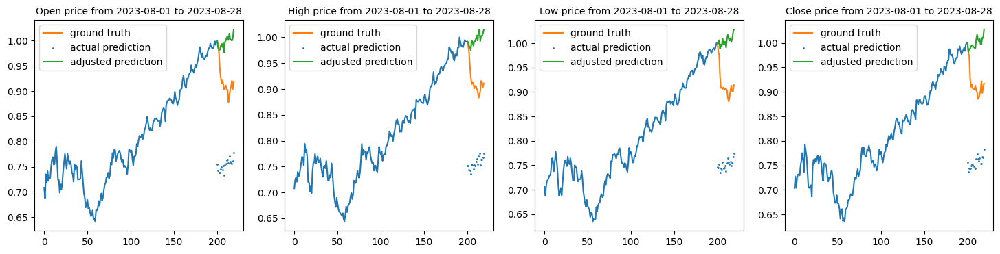

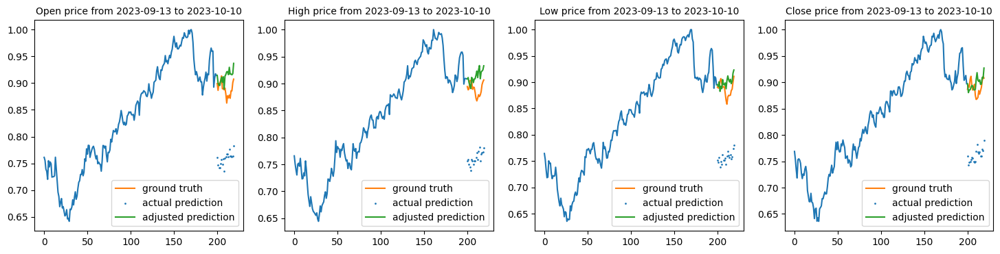

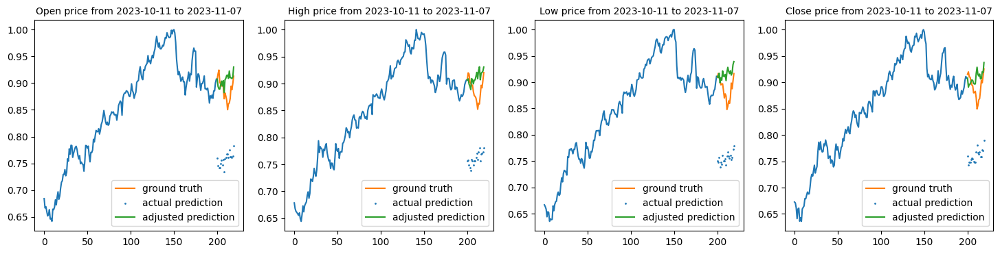

5722/5722 [==============================] - 121s 20ms/step - loss: 0.0029 - val_loss: 0.0210
Epoch 2/15
1/1 [==============================] - 0s 52ms/step


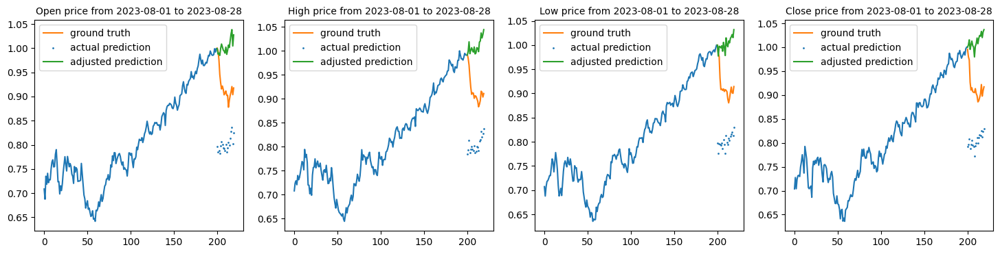

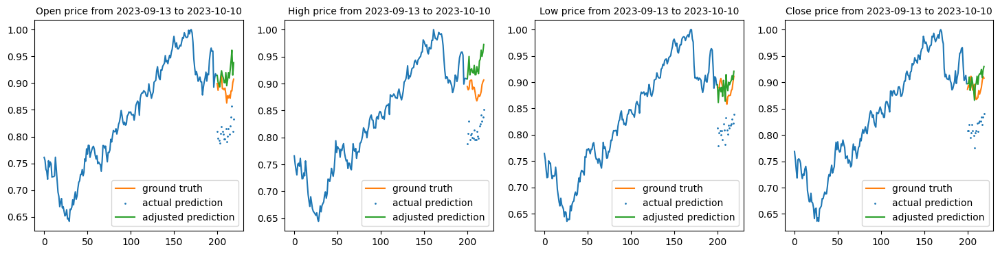

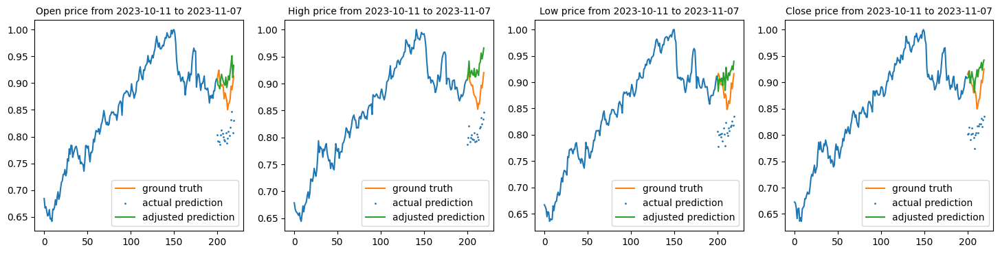

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0015 - val_loss: 0.0095
Epoch 3/15
1/1 [==============================] - 0s 30ms/step


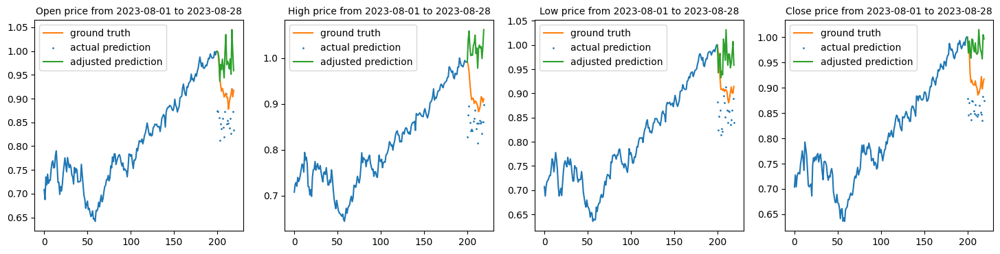

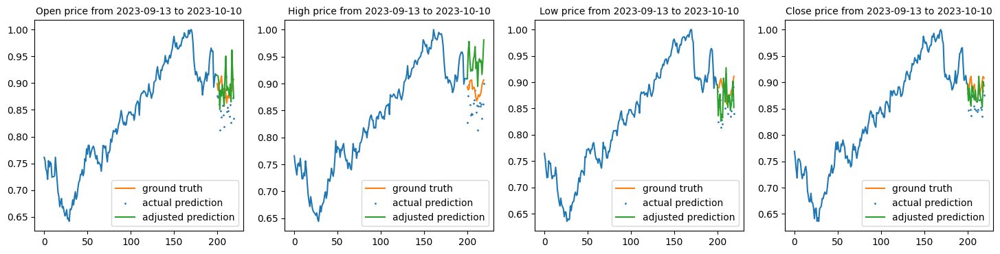

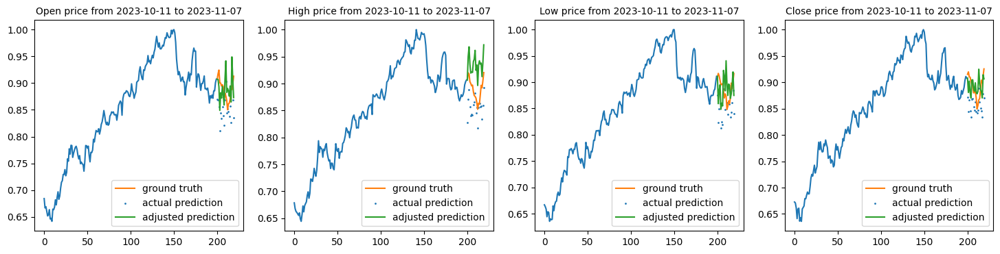

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0013 - val_loss: 0.0030
Epoch 4/15
1/1 [==============================] - 0s 63ms/step


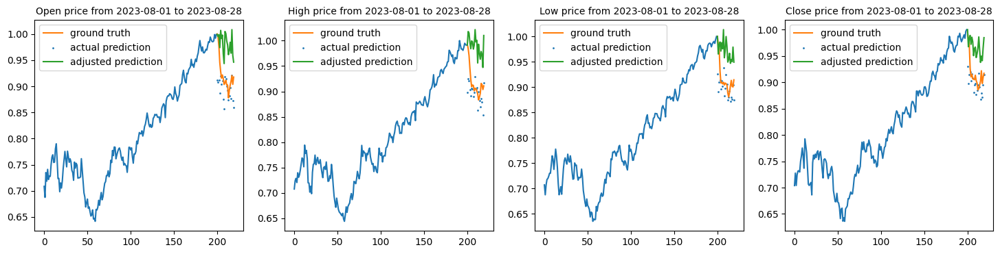

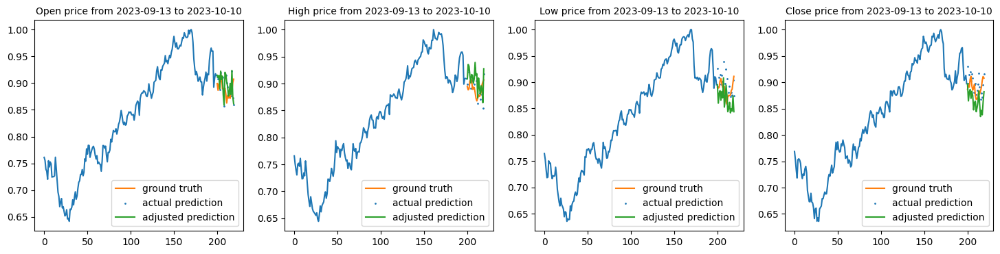

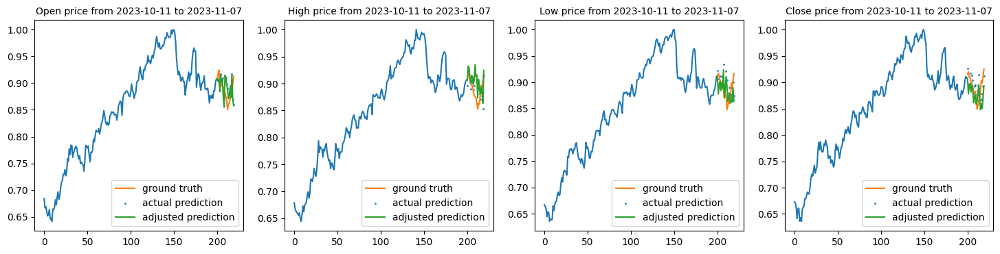

5722/5722 [==============================] - 116s 20ms/step - loss: 0.0011 - val_loss: 8.0544e-04
Epoch 5/15
1/1 [==============================] - 0s 26ms/step


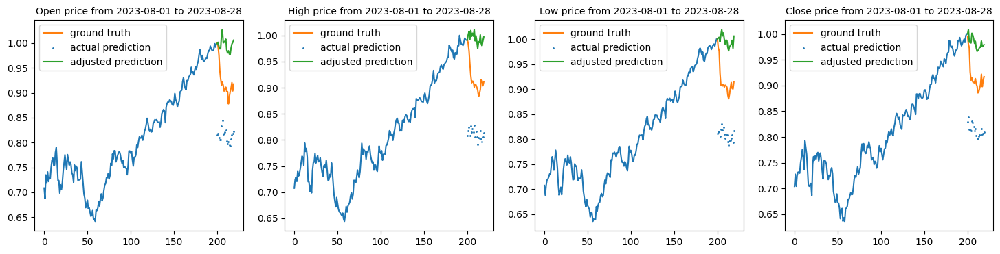

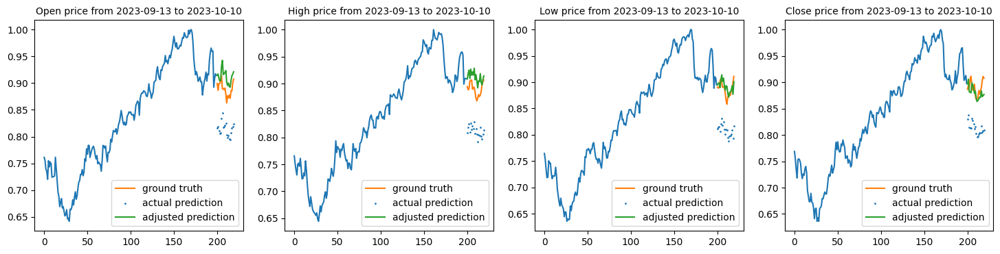

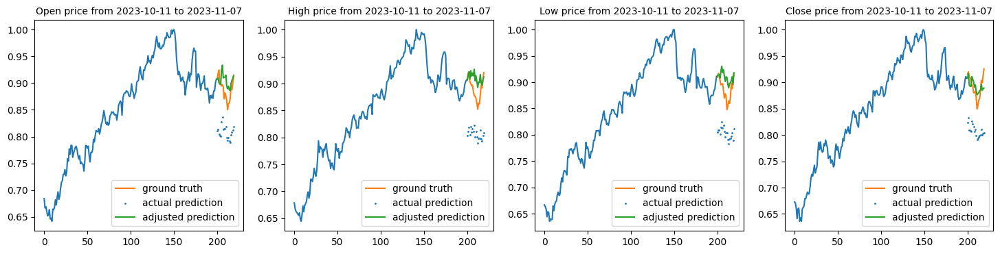

5722/5722 [==============================] - 116s 20ms/step - loss: 9.9920e-04 - val_loss: 0.0085
Epoch 6/15
2246/5722 [==========>...................] - ETA: 1:09 - loss: 9.6001e-04

In [18]:
AAPL_lstm_model_v_a_CustomCallback  = CustomCallback2(AAPL_lstm_model_v_a, AAPL_x_test, SPX_x_test, AAPL_y_test)
aapl_history = AAPL_lstm_model_v_a.fit([AAPL_x_train[:,:,1:].astype('float32'), SPX_x_train[:,:,1:].astype('float32')], AAPL_y_train[:,:,1:5].astype('float32'), epochs=15, batch_size=1, callbacks=[AAPL_lstm_model_v_a_CustomCallback], validation_data=([AAPL_x_test[:,:,1:].astype('float32'), SPX_x_test[:,:,1:].astype('float32')], AAPL_y_test[:,:,1:5].astype('float32')))


print(aapl_history.history['val_loss'])
print(aapl_history.history['loss'])

plt.plot(aapl_history.history['val_loss'])
plt.plot(aapl_history.history['loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation loss', 'Training loss'])
plt.show()